# *rest2vec*: Vectorizing the resting-state functional connectome using graph embedding
By Zachery D. Morrissey, Liang Zhan, Olusola Ajilore, and Alex D. Leow, 2020. *NeuroImage*.
https://doi.org/10.1016/j.neuroimage.2020.117538

# 0. Imports and settings

In [2]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import gridspec
import matplotlib.patches as patches
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable
import mpl_toolkits.axisartist as axisartist
from scipy.io import loadmat
from scipy.interpolate import griddata
from scipy.stats import pearsonr
from sklearn.metrics.pairwise import euclidean_distances as edist
from scipy.spatial.distance import euclidean
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import silhouette_samples
from sklearn.preprocessing import MinMaxScaler
from nibabel.affines import apply_affine
import statsmodels.formula.api as smf
import statsmodels as sm
import statsmodels.stats.multicomp as multicomp
import seaborn as sns
import nibabel as nib
import os
import networkx as nx
import bct
import itertools
from sklearn.manifold import Isomap
from sklearn.metrics import normalized_mutual_info_score as nmi
from nilearn.plotting import (plot_connectome, 
                              plot_anat, plot_stat_map, 
                              plot_surf_stat_map,
                              plot_glass_brain)
from nilearn import surface
from nilearn import datasets
from nilearn.image import coord_transform
from nipype.interfaces import fsl
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.weightstats import ttest_ind
from matplotlib.ticker import MaxNLocator
import rest2vec as r2v

200827-18:04:11,643 nipype.utils INFO:
	 Running nipype version 1.3.0-rc1 (latest: 1.5.0)


## 0.1 Plot aesthetics

In [3]:
# Inspired by: https://stackoverflow.com/questions/3899980/how-to-change-the-font-size-on-a-matplotlib-plot#3900167

# Fonts
# -----
sns.set(style='ticks')
vermillion = '#E34234'
etred = '#DC2828'

small_size = 10
medium_size = 12
large_size = 16

matplotlib.rc('text', usetex=False)
matplotlib.rc('font', family='sans-serif')           # serif-style fonts
matplotlib.rc('font', serif='Helvetica')
matplotlib.rc('font', size=small_size)          # controls default text sizes
matplotlib.rc('axes', titlesize=medium_size)    # fontsize of the axes title
matplotlib.rc('axes', labelsize=medium_size)    # fontsize of the x and y labels
matplotlib.rc('xtick', labelsize=small_size)    # fontsize of the tick labels
matplotlib.rc('ytick', labelsize=small_size)    # fontsize of the tick labels
matplotlib.rc('legend', fontsize=small_size)    # legend fontsize
matplotlib.rc('figure', titlesize=large_size)   # fontsize of the figure title
matplotlib.rc('svg', fonttype='none')

# Custom blue-orange diverging colormap
sns_white = (244/255, 244/255, 244/255)
tab10_blue = matplotlib.cm.tab10.colors[0]
tab10_orange = matplotlib.cm.tab10.colors[1]
BuOr_mpl_colors = [tab10_blue, sns_white, tab10_orange]  # from tab10 palette
bins = 100
BuOr_mpl = matplotlib.colors.LinearSegmentedColormap.from_list('BuOr', BuOr_mpl_colors, N=bins)

# NeuroImage figure widths
single_col_width = 255  # (pt)
onehalf_col_width = 397
double_col_width = 539

# Dataset titles
# --------------
titles = ['F1000 dataset', 'Diez dataset'] 


# Plot helper functions
# ---------------------
def normalize(x):
    """Transform vector of continuous data to be between [0, 1]. 
    Intended for setting alpha values in scatter plots.
    
    Parameters
    ----------
    x : numpy vector or array
        N x 1 array to transform.
        
    Returns
    -------
    normalized_x : numpy vector
        N x 1 array of x between [0, 1]
    """
    
    return ((x - min(x)) / (max(x) - min(x)))

    
def square_ax(ax):
    """Set aspect ratio to make square box for axes.
    
    Parameter
    ---------
    ax : matplotlib axes
        Axes to make square aspect ratio.
        
    Returns
    -------
    ratio : float
        Ratio to be given to axes.set_aspect() function.
    """
    
    x0, x1 = ax.get_xlim()
    y0, y1 = ax.get_ylim()
    
    return (x1 - x0) / (y1 - y0)


def create_node_colors(labels, 
                       cmap=matplotlib.cm.tab10.colors):
    """Given a community assignment vector, returns a corresponding
    3D node color array based off of the default matplotlib discrete
    color palette for use with plotting (e.g. scatter).
    
    Parameters
    ----------
    labels : numpy array 
        Community assignment vector of size N (assumes zero-index).
        
    Returns
    -------
    node_colors : numpy array
        N x 3 array of RGB values corresponding to the default 
        matplotlib discrete color palette.
    """
    
    K = len(np.unique(labels))  # number of communities
    
    #cmap = np.array(matplotlib.cm.tab10.colors[:K])
    cmap = np.array(cmap[:K])
        
    node_colors = np.zeros([len(labels), 3])
    node_colors = cmap[labels.astype(int)]
    
    return node_colors


def coord_polar(mat):
    """Convert 2D array from Cartesian (x, y) coordinates to
    polar (r, theta) coordinates.
    
    Parameters
    ----------
    mat : numpy array
        N x 2 array of Cartesian coordinates.
        
    Returns
    -------
    r : numpy vector
        Polar radius vector of size N.
    
    theta : numpy vector
        Polar angle vector of size N.
    """
    x = mat[:, 0].copy()
    y = mat[:, 1].copy()

    r = np.sqrt(x**2 + y**2)
    theta = np.arctan2(y, x)

    return r, theta


def create_N_colors(N, palette=matplotlib.cm.tab10.colors):
    """Get N colors from color palette.
    
    Parameters
    ----------
    N : int
        Number of distinct colors.
        
    palette : matplotlib colormap
        Colormap to choose colors from (tab10 by default).
        
    Returns
    -------
    node_colors : numpy array
        N x 3 numpy array of RGB values.
    """
    
    node_colors = np.array(palette[:N])   
    
    return node_colors


def set_size(width, fraction=1, subplots=(1, 1)):
    """ Set figure dimensions to avoid scaling in LaTeX [1].

    Parameters
    ----------
    width : float or string
            Document width in points, or string of predined document type
    fraction : float, optional
            Fraction of the width which you wish the figure to occupy
    subplots : array-like, optional
            The number of rows and columns of subplots.
    Returns
    -------
    fig_dim : tuple
            Dimensions of figure in inches
            
    References
    ----------
    [1] https://jwalton.info/Embed-Publication-Matplotlib-Latex/
    """
    
    if width == 'thesis':
        width_pt = 426.79135
    elif width == 'beamer':
        width_pt = 307.28987
    elif width == 'pnas':
        width_pt = 246.09686
    else:
        width_pt = width

    # Width of figure (in pts)
    fig_width_pt = width_pt * fraction
    # Convert from pt to inches
    inches_per_pt = 1 / 72.27

    # Golden ratio to set aesthetic figure height
    golden_ratio = (5**.5 - 1) / 2

    # Figure width in inches
    fig_width_in = fig_width_pt * inches_per_pt
    # Figure height in inches
    fig_height_in = fig_width_in * golden_ratio * (subplots[0] / subplots[1])

    return (fig_width_in, fig_height_in)


def offset_div_cmap(v):
    """Center colormap to min and max of vector v with center at 0."""
    offset = matplotlib.colors.DivergingNorm(vmin=v.min(),
                                             vcenter=0,
                                             vmax=v.max())
    
    return offset


# Color blind-friendly palette for > 2 colors
# http://www.cookbook-r.com/Graphs/Colors_(ggplot2)/
cb_palette = np.array([[86, 180, 233],
                       [230, 159, 0],
                       [0, 158, 115],
                       [213, 94, 0],
                       [204, 121, 167]]) / 255

## 0.2 Set project root path

In [6]:
# Set path (assumes notebook is in top parent folder)
path = os.path.abspath('.')
path

'/home/zdm/Lab/Projects/PhASE'

# 1. Import data

Data is taken from the [Functional 1000 Connectomes Project](http://umcd.humanconnectomeproject.org/umcd/default/index]]) and [NITRC]([[https://www.nitrc.org/projects/biocr_hcatlas/]]).

In [7]:
# 177 ROI group data
f1000_data = loadmat(f'{path}/data/F1000_NW.mat')
NW = f1000_data['NW']  # N x N x num_subjects Pearson correlation connectomes

# MNI coordinates and labels for regions
roi_xyz = pd.read_csv(f'{path}/data/F1000_roi_xyz.csv', names=['x', 'y', 'z'], squeeze=True)
roi_names = pd.read_csv(f'{path}/data/F1000_roi_labels.csv', names=['roi'], squeeze=True)


# Subject demographics
age = pd.read_csv(f'{path}/data/F1000_subject_age.csv', header=None, squeeze=True)
sex = pd.read_csv(f'{path}/data/F1000_subject_sex.csv', header=None, squeeze=True)

subject_info = pd.DataFrame({'age': age, 'sex': sex})
subject_info.groupby('sex').describe()

age                                                       
        count       mean        std   min   25%   50%      75%   max
sex                                                                 
Female  560.0  27.875929  12.744147  18.0  21.0  22.0  27.0850  85.0
Male    426.0  28.714718  12.717932  18.0  21.0  23.0  30.9575  74.0

Statistical differences in age between males and females?

In [8]:
male_age = subject_info.loc[subject_info['sex'] == 'Male', 'age'].to_numpy()
female_age = subject_info.loc[subject_info['sex'] == 'Female', 'age'].to_numpy()

tstat, pvalue, df = ttest_ind(male_age, female_age)
print(f't = {tstat}\np = {pvalue}\ndf = {df}')

t = 1.0246805224882132
p = 0.3057657882544266
df = 984.0


In [9]:
male_age.mean() - female_age.mean()

0.8387897384305845

MNI labels for the Diez dataset ROIs were calculated using the [label4MRI](https://github.com/yunshiuan/label4MRI) package for `R`.

In [10]:
# Load Diez data
h2514_roi_info = pd.read_csv(f'{path}/data/2514-roi-hemi-lobe-info.csv')
h2514_data = loadmat(f'{path}/data/2514_NW.mat')
h_roi_xyz = pd.read_csv(f'{path}/data/2514_roi_xyz.csv', header=None, 
                        squeeze=True, names=['x', 'y', 'z'])
h_roi_names = h2514_roi_info['roi']
#h_roi_names = pd.read_csv(f'{path}/data/2514_mni_labels.csv', squeeze=True)

hNW = h2514_data['hNW']

# 2. Results

## 2.1 Compute embedding data

In [11]:
f1000 = r2v.PhaseEmbedding(NW, roi_xyz, roi_names,  n_neighbors=15).fit()

In [12]:
# NOTE: This may take a few minutes to run due to large matrix size
h2514 = r2v.PhaseEmbedding(hNW, h_roi_xyz, h_roi_names, n_neighbors=50).fit()  # Diez dataset

/home/zdm/Lab/Projects/PhASE/rest2vec.py:119: RuntimeWarning: divide by zero encountered in true_divide
  self.theta = np.arctan(np.sqrt(self.P / (1 - self.P)))


## Add additional ROI data to embedding dataframes

In [13]:
f1000.df['hemi'] = np.where(f1000.df['roi'].str[0] == 'L', 'L', 'R')
f1000.df.loc[f1000.df['roi'] == 'Brain-Stem', 'hemi'] = 'Brain-Stem'
f1000.df.loc[f1000.df['roi'] != 'Brain-Stem', 'roi'] = f1000.df.loc[f1000.df['roi'] != 'Brain-Stem', 'roi'].str.split(r'Left |Right ').str[1]
f1000_lobe_assignments = pd.read_csv(f'{path}/data/f1000-lobe-roi-assignments.csv')
f1000_lobe_lut = dict(zip(f1000_lobe_assignments['roi'].to_list(), 
                          f1000_lobe_assignments['lobe'].to_list()))
f1000.df['lobe'] = f1000.df['roi'].map(f1000_lobe_lut)

h2514.df['lobe'] = h2514_roi_info['lobe']
h2514.df['hemi'] = h2514_roi_info['hemi'] 

In [19]:
# Save MNI and isomap embedding coordinates
(f1000.df[['roi', 'hemi', 'mni_x', 'mni_y', 'mni_z', 'x', 'y']]
 .to_csv(f'{path}/data/saved_data/F1000-MNI-rest2vec-coordinates.csv'))

(h2514.df[['roi', 'hemi', 'mni_x', 'mni_y', 'mni_z', 'x', 'y']]
 .to_csv(f'{path}/data/saved_data/Diez-MNI-rest2vec-coordinates.csv'))

### Example matrix figures for Inkscape

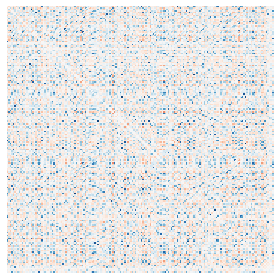

In [14]:
sns.heatmap(f1000.avg_nw, cmap='RdBu', center=0, cbar=False, rasterized=True, square=True)
plt.tick_params(axis='both', which='both', bottom=False, left=False,
                labelbottom=False, labelleft=False)
plt.tight_layout()
plt.savefig(f'{path}/figures/inkscape/avg-nw-mat.png', dpi=300, transparent=True)

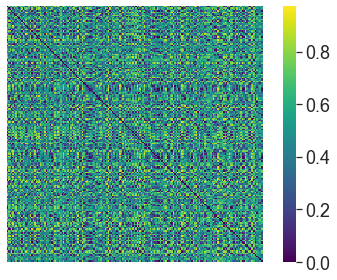

In [14]:
im = sns.heatmap(f1000.P, cmap='viridis', rasterized=True, square=True)
plt.tick_params(axis='both', which='both', bottom=False, left=False,
                labelbottom=False, labelleft=False)

cbar = im.collections[0].colorbar
cbar.ax.tick_params(labelsize=18)
plt.tight_layout()
plt.savefig(f'{path}/figures/inkscape/P-mat.png', dpi=300, transparent=True)

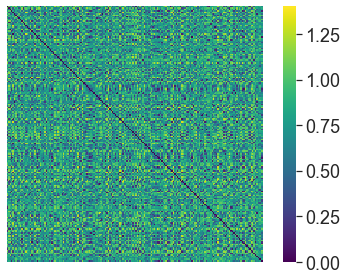

In [15]:
im = sns.heatmap(f1000.theta, cmap='viridis', rasterized=True, square=True)
plt.tick_params(axis='both', which='both', bottom=False, left=False,
                labelbottom=False, labelleft=False)

cbar = im.collections[0].colorbar
cbar.ax.tick_params(labelsize=18)
plt.tight_layout()
plt.savefig(f'{path}/figures/inkscape/theta-mat.png', dpi=300, transparent=True)

MMD distribution example for pipeline figure.

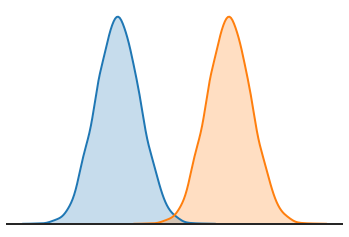

In [16]:
np.random.seed(0)  # initialize seed at same position

# Create fake data
x = np.random.normal(loc=1, size=5000)
y = x + 5
data = [x, y]
colors = create_N_colors(2)

# Build plot
f, ax = plt.subplots()

for i in range(2):
    sns.kdeplot(data=data[i], shade=True, color=colors[i],
               linewidth=2)

# Plot aesthetics
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set(linewidth=2)
ax.get_xaxis().set_ticks([])
ax.get_yaxis().set_ticks([])

f.savefig(f'{path}/figures/mmd-example.svg', dpi=300)

## 2.2 $\mathbf{W}$, $\mathbf{P}^{-}$, $\Theta$, and $\mathbf{K}$ matrices

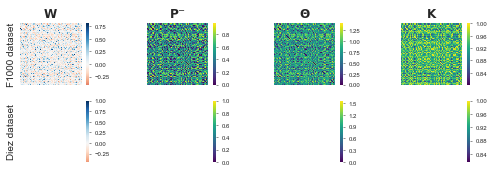

In [17]:
# Preset figure size
# -----------------------
# 177 and 2514 ROI P, Theta, and K matrices
mats = [f1000.avg_nw, f1000.P, f1000.theta, f1000.K,
        h2514.avg_nw, h2514.P, h2514.theta, h2514.K]

subtitles = ['$\\mathbf{W}$', '$\\mathbf{P}^{-}$', '$\\mathbf{\\Theta}$','$\\mathbf{K}$']

row_idx, col_idx = np.unravel_index(np.arange(8), shape=(2, 4))

#fig_width_in, fig_height_in = set_size(width)
fig_width_in, fig_height_in = set_size(double_col_width)
f, ax = plt.subplots(nrows=2, figsize=(fig_width_in, 2.5), ncols=4)

for idx, (i, j) in enumerate(zip(row_idx, col_idx)):
    
    if j == 0:
        # Pearson correlation connectome
        im = sns.heatmap(mats[idx], cmap='RdBu', square=True,
                         center=0, ax=ax[i, j], rasterized=True,
                         cbar_kws={'fraction': 0.038, 'pad': 0.04})
        
        ax[i, j].set_ylabel(titles[i], fontsize=10)  # column labels
        
    else:
        # P, theta, K
        im = sns.heatmap(mats[idx], cmap='viridis', ax=ax[i, j], 
                         rasterized=True, square=True,
                         cbar_kws={'fraction': 0.038, 'pad': 0.04})
    
    # Remove ticks and ticklabels
    ax[i, j].tick_params(axis='both', which='both', bottom=False, left=False,
                         labelbottom=False, labelleft=False)
    
    # Colorbar label size
    cbar = im.collections[0].colorbar
    cbar.ax.tick_params(labelsize=6, size=2, width=0.5)

    if i == 0:
        ax[i, j].set_title(subtitles[j], fontsize=12)  # row labels
               
f.tight_layout()
f.savefig(f'{path}/figures/heatmaps-1in-width.png', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/heatmaps-1in-width.pdf', dpi=300, bbox_inches='tight')

## 2.4 Modularity

### MMD modularity

Iterate the value of the MMD at various cut sites along the top eigenvector of the centered kernel similarity matrix $\left(\mathbf{\tilde{K}}\right)$.

In [18]:
def eval_cuts(embedding, n_cuts=50):
    """Evaluate MMD at various cut thresholds along qmax.
    
    Parameters
    ----------
    embedding : rest2vec object
        rest2vec.phase_embedding object containing embedding data.
        
    n_cuts : integer
        Number of thresholds of qmax to evaluate (default = 50).
        
    Returns
    -------
    df_mmd : pandas dataframe
        Dataframe containing of observed MMD at each cut site.
    """
    
    cut_sites = np.linspace(start=embedding.qmax.min(), 
                            stop=embedding.qmax.max(), 
                            num=n_cuts)
    
    mmd = np.zeros([len(cut_sites)])
    ratio = np.zeros_like(mmd)
    
    m = np.zeros_like(mmd)
    n = np.zeros_like(mmd)
    N = len(embedding.roi_xyz)

    for i, cut in enumerate(cut_sites):
        m[i] = np.sum(embedding.qmax >= cut)
        n[i] = np.sum(embedding.qmax < cut)
        ratio[i] = m[i] / N
        
        # Equation 13
        vstar = embedding.qmax.copy()[:, np.newaxis]
        vstar[embedding.qmax >= cut] = np.sqrt((m[i] * n[i]) / N) * (1 / m[i])
        vstar[embedding.qmax < cut] = np.sqrt((m[i] * n[i]) / N) * (-1 / n[i])
        mmd[i] = (4/N) * (vstar.T @ embedding.Kcen @ vstar)
  
    df_mmd = pd.DataFrame({'n': n, 
                           'm': m, 
                           'm/N': m/N, 
                           'cut': cut_sites, 
                           'mmd': mmd})
    
    df_mmd = pd.melt(df_mmd, id_vars=['cut', 'mmd', 'm/N'], value_vars=['n', 'm'],
                     var_name='partition', value_name='size')
    
    return df_mmd


df_mmd_f1000 = eval_cuts(f1000, n_cuts=50)
df_mmd_h2514 = eval_cuts(h2514, n_cuts=50)

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: divide by zero encountered in double_scalars
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in double_scalars


Plot histogram of top eigenvector, partition size as a function of cut site, and MMD value as a function of cut site.

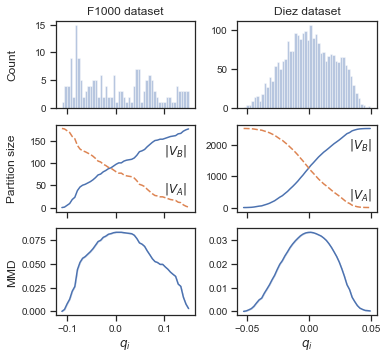

In [19]:
f, ax = plt.subplots(nrows=3, 
                     ncols=2, 
                     #figsize=set_size(width, fraction=0.75, subplots=(3, 2)), 
                     figsize=set_size(onehalf_col_width, subplots=(3, 2)),
                     sharex='col') 

dists = [f1000.qmax, h2514.qmax]
dfs = [df_mmd_f1000, df_mmd_h2514]

for i in range(2):
    # Distribution of qmax
    sns.distplot(dists[i], bins=50, kde=False, ax=ax[0, i])

    # Cut site vs partition size line plot
    sns.lineplot(x='cut', y='size', hue='partition', style='partition',
                 data=dfs[i], linewidth=1.5, ax=ax[1, i], legend=False)
    
    # Cut site vs MMD line plot
    sns.lineplot(x='cut', y='mmd', linewidth=1.5, ax=ax[2, i], data=dfs[i])
    
    # Axes labels
    if i == 0:
        # 177 ROI column
        ax[0, i].set_ylabel('Count')
        ax[0, i].set_title(titles[i])
        ax[0, i].locator_params(axis='y', nbins=4)  # i.e., 3 tick breaks   
        ax[1, i].set_ylabel('Partition size')
        ax[1, i].locator_params(axis='y', nbins=4)     
        ax[2, i].set_xlabel('$q_{i}$')
        ax[2, i].set_ylabel('MMD')
        
    if i == 1:
        # 2514 ROI column (sharex along columns, so remove y-axis labels)
        ax[0, i].set_ylabel('')
        ax[0, i].set_title(titles[i])    
        ax[1, i].set_ylabel('')       
        ax[2, i].set_xlabel('$q_{i}$')
        ax[2, i].set_ylabel('')
        
# Annotate partition labels directly on line plots
annotation_size = 12
ax[1, 0].annotate('$|V_{B}|$', xy=(0.1, 120), fontsize=annotation_size)
ax[1, 0].annotate('$|V_{A}|$', xy=(0.1, 35), fontsize=annotation_size)
ax[1, 1].annotate('$|V_{B}|$', xy=(0.032, 1900), fontsize=annotation_size)
ax[1, 1].annotate('$|V_{A}|$', xy=(0.032, 300), fontsize=annotation_size)
        
f.align_ylabels()
f.tight_layout()
f.savefig(f'{path}/figures/qmax-and-mmd-partition-size-1in-width.png', 
          dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/qmax-and-mmd-partition-size-1in-width.pdf', 
          dpi=300, bbox_inches='tight')

Eigenvalues of $\tilde{\mathbf{K}}$

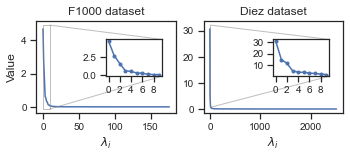

In [41]:
mats = [f1000.Kcen, h2514.Kcen]
evecs = [f1000.evecs, h2514.evecs]
evals = [f1000.evals, h2514.evals]

f, ax = plt.subplots(ncols=2, 
                     figsize=set_size(onehalf_col_width, subplots=(1, 2)))

for i in range(2):
    ax[i].plot(np.arange(len(evals[i])), evals[i], linewidth=1.5)
    ax[i].set_xlabel('$\\lambda_{i}$')
    ax[i].set_title(titles[i])
    
    if i == 0:
        ax[i].set_ylabel('Value')

    # Inset
    num_evals = 10
    axins = ax[i].inset_axes([0.5, 0.4, 0.4, 0.4])
    axins.plot(np.arange(num_evals), evals[i][:num_evals], 
               '-o', linewidth=1.5, markersize=3)
    axins.xaxis.set_major_locator(MaxNLocator(5, integer=True))  # force integer xticks
    ax[i].indicate_inset_zoom(axins)


f.savefig(f'{path}/figures/kcen-evals-1in-width.png', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/kcen-evals-1in-width.pdf', dpi=300, bbox_inches='tight')

### Glass brain visualization of MMD modularity

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:1766: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if node_color == 'auto':
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.8086116487941177. But, you have given threshold=1 
  threshold))
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.901382345271923. But, you have given threshold=1 
  threshold))


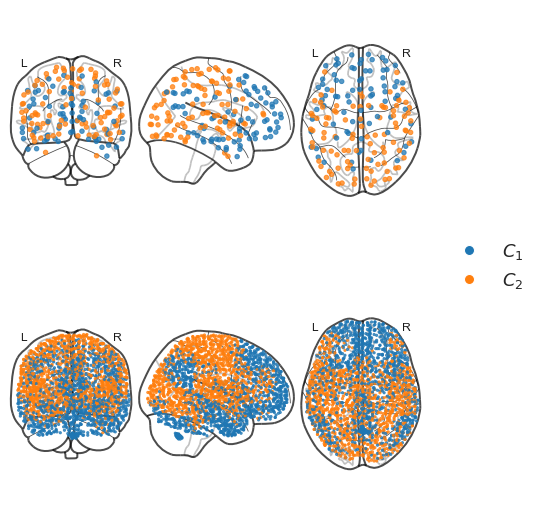

In [42]:
# Connectome plot aesthetics
# --------------------------
s = [20, 5]
alpha = 0.75
edge_threshold = 1  # turn off edges

#f, ax = plt.subplots(nrows=2, figsize=(8, 6))
f, ax = plt.subplots(nrows=2, figsize=set_size(double_col_width, subplots=(2, 1)))
  
# 177 ROI plot
# ------------
cmap = np.array(matplotlib.cm.tab10.colors[:len(np.unique(f1000.mod))])

node_color = create_node_colors(f1000.mod)

plot_connectome(f1000.avg_nw, node_coords=f1000.roi_xyz, node_size=20, 
                node_color=node_color, colorbar=False, edge_threshold=1, 
                node_kwargs={'alpha': 0.75}, axes=ax[0])

custom_lgd = [Line2D([0], [0], markerfacecolor=cmap[0], color='w', 
                     marker='o', markersize=10),
              Line2D([0], [0], markerfacecolor=cmap[1], color='w', 
                     marker='o', markersize=10)]

ax[0].legend(custom_lgd, ['$C_{1}$', '$C_{2}$'], 
             bbox_to_anchor=(1.05, 0), loc=2, borderaxespad=0.0, fontsize=18, frameon=False)


# 2514 ROI plot
# -------------
node_color = create_node_colors(1 - (h2514.mod.astype(int)))

plot_connectome(h2514.avg_nw, node_coords=h2514.roi_xyz, node_size=5, 
                node_color=node_color, colorbar=False, edge_threshold=1, 
                node_kwargs={'alpha': 0.75}, axes=ax[1])

f.savefig(f'{path}/figures/mmd-mod-glass-brain.png', dpi=300, 
            bbox_inches='tight')

Export `.node` and `.edge` for compatibility with [BrainNet](https://www.nitrc.org/projects/bnv).

In [43]:
f1000.to_brainnet(C=f1000.mod, prefix=f'data/saved_data/r2v-brainnet-f1000-mmd-mod')
h2514.to_brainnet(C=h2514.mod, prefix=f'data/saved_data/r2v-brainnet-2514-mmd-mod')

Saved ./data/saved_data/r2v-brainnet-f1000-mmd-mod.node.
Saved ./data/saved_data/r2v-brainnet-f1000-mmd-mod.edge
Saved ./data/saved_data/r2v-brainnet-2514-mmd-mod.node.
Saved ./data/saved_data/r2v-brainnet-2514-mmd-mod.edge


## 2.5 Dimensionality reduction

The [Isomap](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.Isomap.html) algorithm was used to reduce the dimensionality of the phase angle spatial embedding matrix $\mathbf{\Theta}$ from $N$ dimensions to 3 dimensions.

## 2.6 Distance to origin

Lineplot of sorted ROI distance to the origin for each dataset.

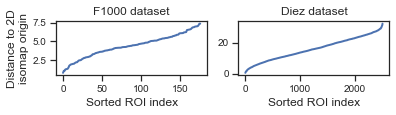

In [55]:
f, ax = plt.subplots(ncols=2, figsize=set_size(onehalf_col_width, subplots=(1, 2)))
#mats = [f1000_dist_df, h2514_dist_df]
mats = [f1000.df.sort_values('D'), h2514.df.sort_values('D')]

for i in range(len(mats)):
    ax[i].plot(np.arange(len(mats[i]['D'])), mats[i]['D'], linewidth=2)
    ax[i].set_xlabel('Sorted ROI index')
    ax[i].set(title=titles[i])
    
ax[0].set(ylabel='Distance to 2D\nisomap origin')
#ax[1].set(ylim=(0, 35))

f.tight_layout()
f.savefig(f'{path}/figures/isomap-dist-to-origin-lineplot.png', dpi=300)

Get median distance to origin for each lobe to rank.

In [61]:
medians = (h2514.df[['lobe', 'D']]
           .groupby('lobe')
           .median()
           .sort_values('D')
           .reset_index())
medians

,lobe,D
0,Brainstem,6.907536
1,Sub-lobar,8.530119
2,Limbic Lobe,12.826863
3,Temporal Lobe,13.314003
4,Frontal Lobe,16.728295
5,Cerebellum,17.199769
6,Parietal Lobe,20.922787
7,Occipital Lobe,24.038904


### 2.8.3 Correlation between $\mathbf{\Theta}$ and distance to origin

In [62]:
df = pd.DataFrame({'mean_theta': f1000.theta.mean(axis=1), 
                    'normtheta': np.linalg.norm(f1000.theta, axis=1),
                    'D': f1000.df['D']})

model = smf.ols(formula='D ~ normtheta', data=df)
results = model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      D   R-squared:                       0.333
Model:                            OLS   Adj. R-squared:                  0.330
Method:                 Least Squares   F-statistic:                     87.55
Date:                Sun, 23 Aug 2020   Prob (F-statistic):           3.96e-17
Time:                        18:46:48   Log-Likelihood:                -287.96
No. Observations:                 177   AIC:                             579.9
Df Residuals:                     175   BIC:                             586.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -11.2454      1.674     -6.718      0.0

In [63]:
results.pvalues

Intercept    2.485433e-10
normtheta    3.961064e-17
dtype: float64

In [400]:
np.sqrt(0.333)

0.5770615218501404

In [64]:
h_df = pd.DataFrame({'mean_theta': h2514.theta.mean(axis=1),
                     'normtheta': np.linalg.norm(h2514.theta, axis=1),
                     'D': h2514.df['D']})

h_model = smf.ols(formula='D ~ normtheta', data=h_df)
h_results = h_model.fit()
print(h_results.summary())

                            OLS Regression Results                            
Dep. Variable:                      D   R-squared:                       0.119
Model:                            OLS   Adj. R-squared:                  0.119
Method:                 Least Squares   F-statistic:                     340.2
Date:                Sun, 23 Aug 2020   Prob (F-statistic):           2.40e-71
Time:                        18:46:52   Log-Likelihood:                -8349.3
No. Observations:                2514   AIC:                         1.670e+04
Df Residuals:                    2512   BIC:                         1.671e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -62.8328      4.277    -14.692      0.0

In [401]:
np.sqrt(0.119)

0.3449637662132068

In [65]:
h_results.pvalues

Intercept    6.119962e-47
normtheta    2.395105e-71
dtype: float64

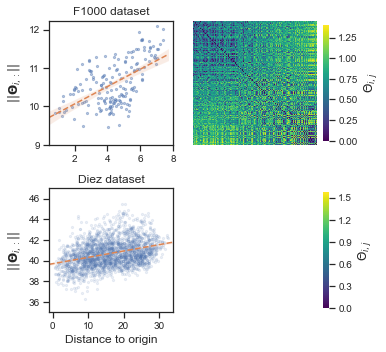

In [68]:
# Correlation between norm theta and distance to origin
#fig_width_in, fig_height_in = set_size(width, fraction=0.75, subplots=(2, 2))
fig_width_in, fig_height_in = set_size(onehalf_col_width, subplots=(2, 2))

f, ax = plt.subplots(ncols=2, nrows=2, figsize=(fig_width_in, fig_width_in-0.5))

# F1000 dataset
sns.regplot(x='D', y='normtheta', data=df, ax=ax[0, 0], 
            scatter_kws={'alpha': 0.4, 's': 5},
            line_kws={'color': 'C1', 'linestyle': 'dashed', 'linewidth': 1.5})

ax[0, 0].set_xlabel('')
ax[0, 0].set_xticks([2, 4, 6, 8])
ax[0, 0].set_xticklabels([2, 4, 6, 8])
ax[0, 0].set_ylabel('$||{\\mathbf{\\Theta}}_{i,:}||$') 
ax[0, 0].set_yticks([9, 10, 11, 12])
ax[0, 0].set_yticklabels([9, 10, 11, 12])
ax[0, 0].set_title(titles[0])

# 2514 dataset
sns.regplot(x='D', y='normtheta', data=h_df, ax=ax[1, 0],
            color='C0', scatter_kws={'alpha': 0.1, 's': 5}, 
            line_kws={'color': 'C1', 'linestyle': 'dashed', 'linewidth': 1.5})

ax[1, 0].set_xlabel('Distance to origin')
ax[1, 0].set_xticks([0, 10, 20, 30])
ax[1, 0].set_xticklabels([0, 10, 20, 30])
ax[1, 0].set_ylabel('$||{\\mathbf{\\Theta}}_{i,:}||$')
ax[1, 0].set_yticks(np.arange(36, 47, 2))
ax[1, 0].set_yticklabels(np.arange(36, 47, 2))
ax[1, 0].set_ylim(35, 47)
ax[1, 0].set_title(titles[1])

# Make regression subplots square
ax[0, 0].set_aspect(square_ax(ax[0, 0]))
ax[1, 0].set_aspect(square_ax(ax[1, 0]))

idx = [np.argsort(df['normtheta']), np.argsort(h_df['normtheta'])]  # sorted theta matrices

for i, mat in enumerate([f1000.theta, h2514.theta]):

    im = sns.heatmap(mat[np.ix_(idx[i], idx[i])], cmap='viridis', ax=ax[i, 1], 
                     square=True, rasterized=True,
                     cbar_kws={'fraction': 0.04, 'pad': 0.04})
    
    # Remove ticks and ticklabels
    ax[i, 1].tick_params(axis='both', which='both', bottom=False, left=False,
                         labelbottom=False, labelleft=False)
    
    # Colorbar label size
    cbar = im.collections[0].colorbar
    cbar.ax.tick_params(labelsize=10)
    cbar.ax.set_ylabel('$\\Theta_{i,j}$')

f.tight_layout()
f.savefig(f'{path}/figures/dist-to-origin-theta-corr-with-mats-1in-width.png', dpi=300)
f.savefig(f'{path}/figures/dist-to-origin-theta-corr-with-mats-1in-width.pdf', dpi=300)

## 2.7 Polar coordinates of 2D isomap embedding

In [71]:
#r, theta = coord_polar(h2514_theta_iso.copy())
node_colors = create_node_colors(h2514.mod)

In [73]:
node_colors = create_node_colors(h2514.mod)
n_lobes = len(h2514.df['lobe'].unique())
colors = np.array(matplotlib.cm.tab20.colors[:n_lobes])
lobes = list(h2514.df['lobe'].unique())
color_dict = dict(zip(lobes, colors))

In [101]:
row_order = medians['lobe']
lut = dict(zip(h2514.df['lobe'].unique().tolist(), np.arange(len(row_order))))
h2514.df['lut'] = h2514.df['lobe'].map(lut) # map LUT values to lobe name in dataframe
#lut = dict(zip(polar_df['lobe'].unique().tolist(), np.arange(len(row_order))))
# polar_df['lut'] = polar_df['lobe'].map(lut)  # map LUT values to lobe name in dataframe
# polar_df

In [102]:
lobe_cmap = create_N_colors(len(row_order), sns.color_palette())

# Create lobe color array [red, green, blue, alpha]
lobe_colors = np.zeros([len(h2514.df['lobe']), 4])
lobe_colors[:, :3] = lobe_cmap[h2514.df['lut'], :]
lobe_colors[:, 3] = normalize(h2514.df['r'])

In [103]:
def polar_facet_plot(f, df, row_order, kind, lobe_colors=None, 
                     lut=None, cbar=False, s=10):
    """Plot facet plots in column to existing figure.
    
    Parameters
    ----------
    f : matplotlib figure
        Figure to plot to.
        
    df : pandas dataframe
        Dataframe with theta, radius, and lobe affiliation columns.
        
    row_order : tuple
        Tuple containing lobe affiliation strings to determine
        order for plotting the facets.
        
    kind : string
        Can be either 'distance' or 'mmd'. Determines the type of
        colormap used.
        
    lobe_colors : list, tuple, or numpy vector
        For 'distance' option, determines RGB value to be assigned 
        to each lobe for creating sequential colormap.
        
    lut : dict
        For 'distance' options, dictionary where keys are lobe 
        affiliation strings and values are integers used to index 
        lobe_colors.
    """
    if kind == 'mmd':
        # Offset to center diverging blue-orange colormap at zero
        offset = matplotlib.colors.DivergingNorm(vmin=h2514.qmax.min(),
                                                 vcenter=0,
                                                 vmax=h2514.qmax.max())

    for i, lobe in enumerate(row_order):
        lobe_df = df.loc[df['lobe'] == lobe]
        ax = f.add_subplot(len(row_order), 1, i+1, projection='polar')
        
        if kind == 'distance':
            lobe_cmap = sns.light_palette(lobe_colors[lut[lobe]], n_colors=50, as_cmap=True)
            ax.scatter(lobe_df['theta'], lobe_df['r'], 
                       c=lobe_df['r'], s=s, cmap=lobe_cmap, 
                       vmin=0, vmax=df['r'].max())
        elif kind == 'mmd':
            im = ax.scatter(lobe_df['theta'], lobe_df['r'], s=s, 
                            c=h2514.qmax[lobe_df.index], cmap=BuOr_mpl,
                            norm=offset,
                            vmin=h2514.qmax.min(), vmax=h2514.qmax.max())

        if cbar is True:
            cbar = f.colorbar(im, ax=ax, pad=0.2)
            cbar.ax.tick_params(labelsize=10)
            
            if kind == 'distance':
                cbar.ax.set_ylabel('Distance')
                
            elif kind == 'mmd':
                cbar.ax.set_ylabel('$q_{i}$')

        # Set labels
        ax.tick_params(axis='x', labelsize=26, pad=15)
        ax.tick_params(axis='y', labelsize=20)
        #ax.set_title(lobe, pad=20) 
        ax.set_title('')
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_ylim(0, 40)
        ax.set_yticks([20, 40])

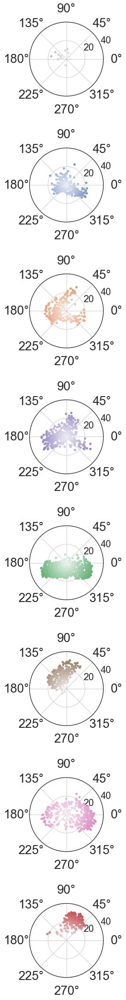

In [107]:
row_order = medians['lobe'].to_list()
sns_lobe_colors = sns.color_palette(n_colors=len(row_order))  # get default color palette values

f = plt.figure(figsize=(set_size(double_col_width, subplots=(len(row_order), 1))))

# polar_facet_plot(f, df=polar_df, kind='distance', row_order=row_order, 
#                  lobe_colors=sns_lobe_colors, lut=lut)

polar_facet_plot(f, df=h2514.df, kind='distance', row_order=row_order, 
                 lobe_colors=sns_lobe_colors, lut=lut, s=15)

f.subplots_adjust(hspace=0.7)
f.savefig(f'{path}/figures/2514-isomap-2d-polar-distance-gradient-cmap.png', dpi=300, 
          bbox_inches='tight')
f.savefig(f'{path}/figures/2514-isomap-2d-polar-distance-gradient-cmap.svg', dpi=300, 
          bbox_inches='tight')

## MMD modularity plots

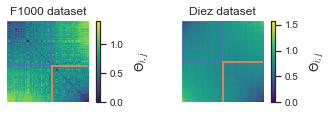

In [399]:
f, ax = plt.subplots(1, 2, figsize=set_size(onehalf_col_width, subplots=(1, 2)))

def plot_sort_mats(embedding, ax):
    qsort_idx = np.argsort(embedding.qmax)

    im = ax.imshow(embedding.theta[np.ix_(qsort_idx, qsort_idx)], cmap='viridis')
    cbar = f.colorbar(im, ax=ax)
    cbar.set_label('$\\Theta_{i,j}$', labelpad=10)

    qsort = np.sort(embedding.qmax).copy()
    qsort_mask = (qsort >= 0)

    # Grid communities
    bounds, ixes = bct.grid_communities(qsort_mask)
    rect0 = patches.Rectangle((0, 0), width=np.floor(bounds[0]), height=np.floor(bounds[0]),
                             fill=False, color='C0', linewidth=2)

    rect1 = patches.Rectangle((np.ceil(bounds[0]), np.ceil(bounds[0])), 
                               width=np.ceil(bounds[0]), height=np.ceil(bounds[0]),
                              fill=False, color='C1', linewidth=2)

    ax.add_patch(rect0)
    ax.add_patch(rect1)

    ax.set(xticks=[], yticks=[], xticklabels=[], yticklabels=[])
    sns.despine(left=True, bottom=True)
    
    return ax

plot_sort_mats(f1000, ax=ax[0])
plot_sort_mats(h2514, ax=ax[1])

ax[0].set_title('F1000 dataset', fontsize=12)
ax[1].set_title('Diez dataset', fontsize=12)

f.tight_layout()
f.subplots_adjust(right=0.85)
f.savefig(f'{path}/figures/theta-sorted-by-q.png', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/theta-sorted-by-q.pdf', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/theta-sorted-by-q.svg', dpi=300, bbox_inches='tight')

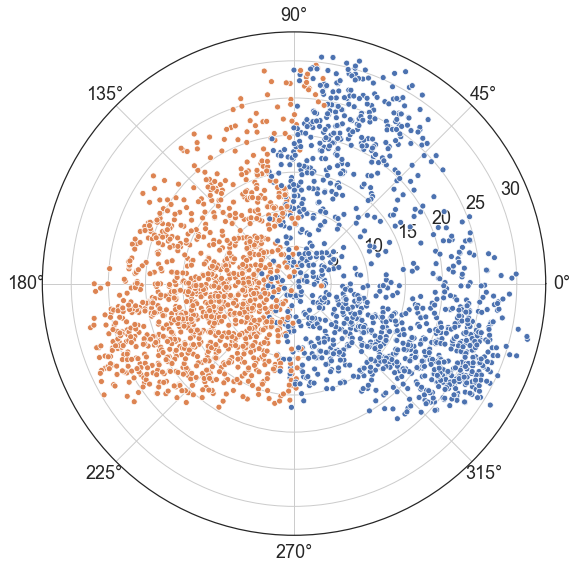

In [113]:
# Plot by MMD modularity
f = plt.figure(figsize=(8, 8))
ax = f.add_subplot(projection='polar')
g = sns.scatterplot(x=h2514.isomap_theta, y=h2514.isomap_r, ax=ax, hue=h2514.mod.astype(int), 
                    legend=False)
ax.tick_params(labelsize=18, axis='both')

# Move legend outside of plot
# h, l = ax.get_legend_handles_labels()  # remove automatic legend title
# ax.legend(h[1:], l[1:], title='Lobe', loc='center left', bbox_to_anchor=(-0.4,  0.5), 
#           borderaxespad=0.)
f.tight_layout()
f.savefig(f'{path}/figures/2514-isomap-2d-polar-all-by-module.pdf', dpi=300)
f.savefig(f'{path}/figures/2514-isomap-2d-polar-all-by-module.png', dpi=300)
f.savefig(f'{path}/figures/2514-isomap-2d-polar-all-by-module.svg', dpi=300)

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:49: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


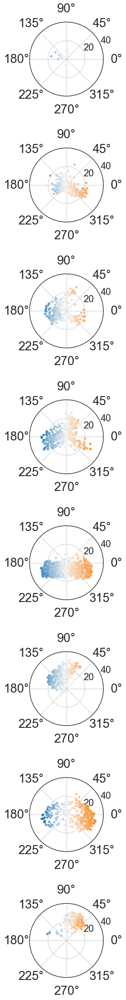

In [121]:
f = plt.figure(figsize=(set_size(double_col_width, subplots=(len(row_order), 1))))

#polar_facet_plot(f, df=polar_df, kind='mmd', row_order=row_order)
polar_facet_plot(f, df=h2514.df, kind='mmd', row_order=row_order, s=15)

f.subplots_adjust(hspace=0.7) # adjust spacing between rows
f.savefig(f'{path}/figures/2514-isomap-mmd-qvalue-gradient-colormap.png', dpi=300, 
          bbox_inches='tight')
f.savefig(f'{path}/figures/2514-isomap-mmd-qvalue-gradient-colormap.svg', dpi=300, 
          bbox_inches='tight')

Plot colormap to go with plots separately

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  """Entry point for launching an IPython kernel.


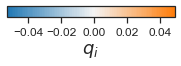

In [122]:
norm = matplotlib.colors.DivergingNorm(vmin=min(h2514.qmax), vcenter=0, vmax=max(h2514.qmax))

f, ax = plt.subplots(figsize=(3, 0.2))
cbar = matplotlib.colorbar.ColorbarBase(ax, cmap=BuOr_mpl, norm=norm, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xlabel('$q_{i}$', fontsize=18)

f.savefig(f'{path}/figures/mmd-gradient-colorbar.svg', bbox_inches='tight')

## Plot distance to origin for each lobe

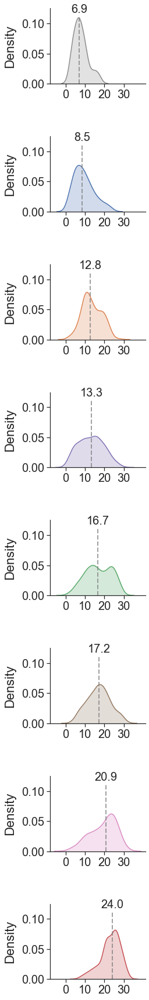

In [145]:
g = sns.FacetGrid(h2514.df, row='lobe', hue='lobe', row_order=row_order)
g.map(sns.kdeplot, 'r', shade=True)

# Axis labels
g.set_titles('')
g.set_xlabels('')
g.set_ylabels('Density', fontsize=22, labelpad=10)

# Axis ticks
for i, ax in enumerate(g.axes.flatten()):
    ax.tick_params(labelbottom=True, labelleft=True, labelsize=20)  # show tick labels for all subplots
    ax.set_xticks(np.arange(0, 40, 10))
    ax.set_ylim(0, 0.125)
    ax.set_yticks([0, 0.05, 0.1])
    
    # Add median reference line and value
    ax.axvline(x=medians['D'][i], 
               color='gray', 
               alpha=0.75, 
               linestyle='--',
               linewidth=2,
               ymax=0.9)
    
    ax.annotate(str(np.round(medians['D'][i], 1)),
                xy=(medians['D'][i], 0.118),
                ha='center', fontsize=20)    
    
g.fig.subplots_adjust(hspace=0.7)  # increase space between rows
g.savefig(f'{path}/figures/2514-distance-to-origin-by-lobe-kdeplot.svg', dpi=300)

Create facet grid of polar plots and KDE plots

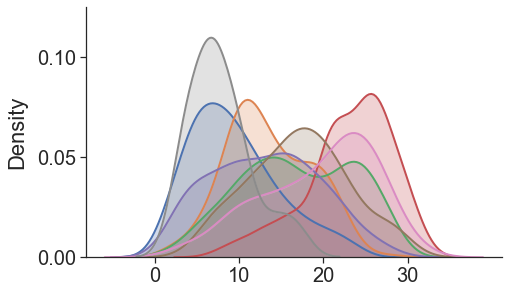

In [148]:
f, ax = plt.subplots(figsize=set_size(double_col_width))
for i, lobe in enumerate(lobes):
    sns.kdeplot(data=h2514.df.loc[h2514.df['lobe'] == lobe, 'r'], 
                shade=True, ax=ax, legend=None, linewidth=2)

ax.set_ylabel('Density', fontsize=22, labelpad=10)
ax.tick_params(labelbottom=True, labelleft=True, labelsize=20)  # show tick labels for all subplots
ax.set_xticks(np.arange(0, 40, 10))
ax.set_ylim(0, 0.125)
ax.set_yticks([0, 0.05, 0.1])
sns.despine()

f.savefig(f'{path}/figures/2514-distance-to-origin-kdeplot.svg', dpi=300)

## Plot glass brain colored by anatomical lobes.

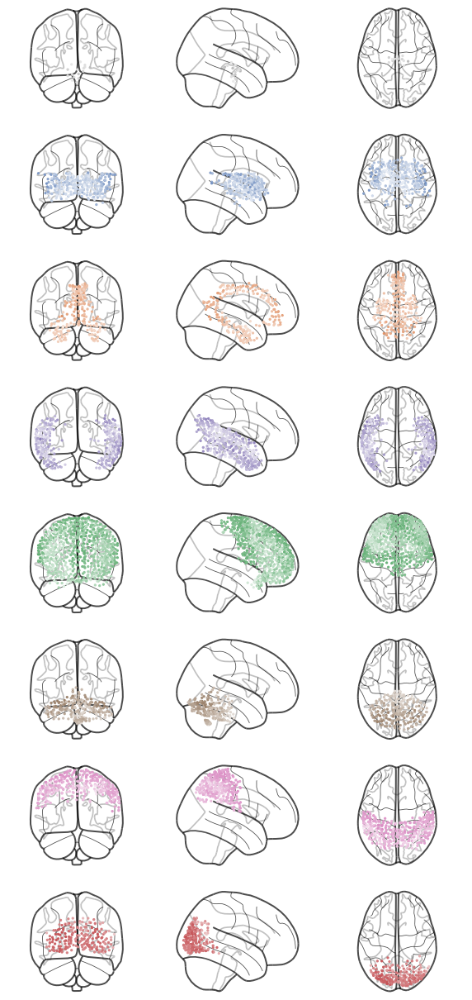

In [154]:
# Facet glass brain by lobe
f, ax = plt.subplots(nrows=len(lobes), figsize=(10, 22))

for i, lobe in enumerate(row_order):
    # Generate lobe data
    lobe_df = h2514.df.loc[h2514.df['lobe'] == lobe]
    lobe_xyz = lobe_df[['mni_x', 'mni_y', 'mni_z']].to_numpy()
    lobe_nw = h2514.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]
    color = h2514.df.loc[h2514.df['lobe'] == lobe, 'r'].to_numpy()
    lobe_cmap = sns.light_palette(sns_lobe_colors[lut[lobe]], n_colors=50, as_cmap=True)
    
    # Build plot
    plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=5,
                   node_color=color, colorbar=False, edge_threshold=1,
                   node_kwargs={'cmap': lobe_cmap, 'vmin': 0, 'vmax':h2514.df['r'].max()}, 
                    axes=ax[i], annotate=False)
    
f.savefig(f'{path}/figures/2514-glass-brain-color-by-lobe-facet-distance-gradient-cmap.png',
          dpi=300,
          bbox_inches='tight')
f.savefig(f'{path}/figures/2514-glass-brain-color-by-lobe-facet-distance-gradient-cmap.svg',
          dpi=300,
          bbox_inches='tight')

## Glass brain colored by MMD modularity

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:207: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:428: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  c=marker_color, **kwargs)


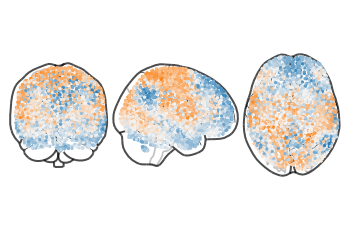

In [157]:
# Plot aesthetics
s = [20, 5]
edge_threshold = 1  # turn off edges

f, ax = plt.subplots()

plot_connectome(h2514.avg_nw, node_coords=h2514.roi_xyz, node_size=5,
                node_color=h2514.qmax, colorbar=False, edge_threshold=1,
                node_kwargs={'cmap': BuOr_mpl,
                             'norm': offset_div_cmap(h2514.qmax),
                             'vmin': min(h2514.qmax),
                             'vmax': max(h2514.qmax)}, 
                axes=ax, annotate=False)

f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-gradient.svg', 
          dpi=300, bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:207: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


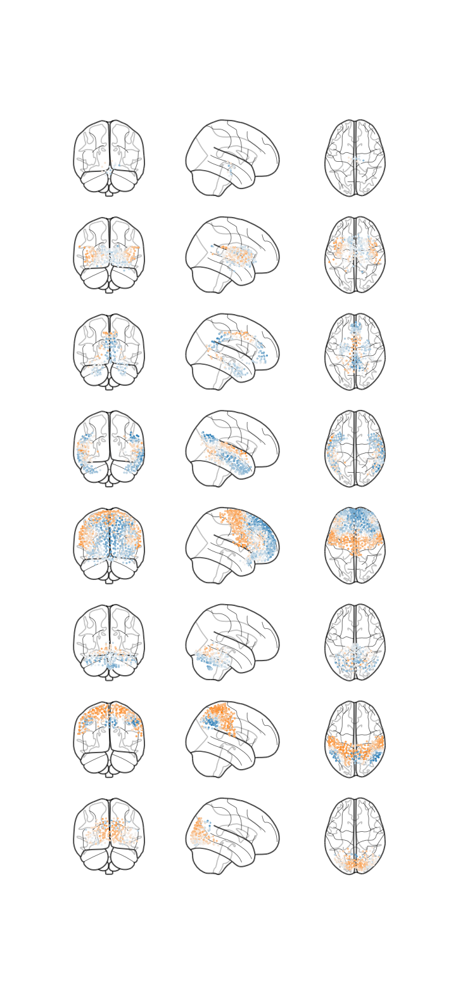

In [159]:
f, ax = plt.subplots(nrows=len(lobes), figsize=(10, 22))

for i, lobe in enumerate(row_order):
    # Generate lobe data
    lobe_df = h2514.df.loc[h2514.df['lobe'] == lobe]
    lobe_xyz = lobe_df[['mni_x', 'mni_y', 'mni_z']].to_numpy()
    lobe_nw = h2514.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]
    
    # Build plot
    plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=5,
                    node_color=h2514.qmax[lobe_df.index], colorbar=False, edge_threshold=1,
                    node_kwargs={'cmap': BuOr_mpl,
                                 'norm': offset_div_cmap(h2514.qmax),
                                 'vmin': min(h2514.qmax),
                                 'vmax': max(h2514.qmax),
                                 'rasterized': True}, 
                    axes=ax[i], annotate=False)
    
f.tight_layout()
f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet-qvalue-gradient.png',
          dpi=300,
          bbox_inches='tight')
f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet-qvalue-gradient.svg',
          dpi=300,
          bbox_inches='tight')

## Second and third eigenvector glass brain plots

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:210: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.


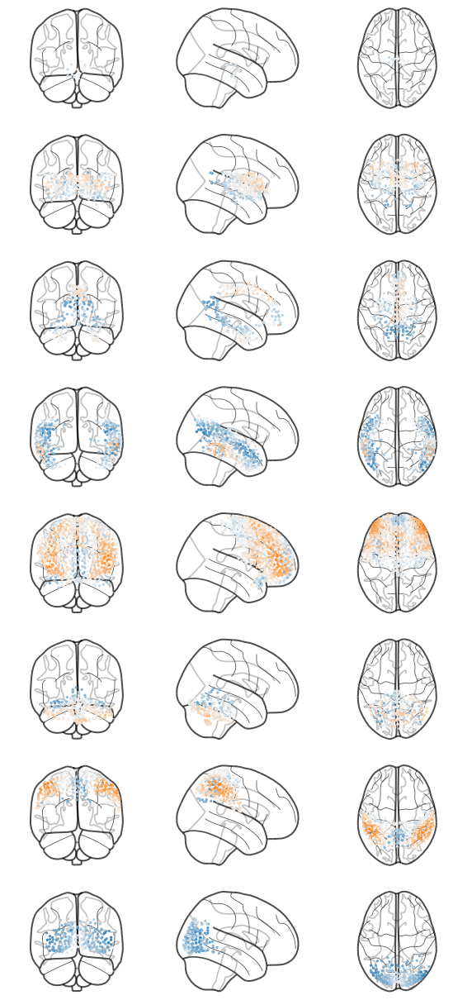

In [404]:
# Test using the second eigenvector to map color
# Center blue-orange values at zero
q2 = h2514.evecs[:, 1] # #2 top eigenvector
q3 = h2514.evecs[:, 2]  # #3 top eigenvector

f, ax = plt.subplots(nrows=len(lobes), figsize=(10, 22))

for i, lobe in enumerate(row_order):
    # Generate lobe data
    lobe_df = h2514.df.loc[h2514.df['lobe'] == lobe]
    lobe_xyz = lobe_df[['mni_x', 'mni_y', 'mni_z']].to_numpy()
    lobe_nw = h2514.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]
    
    # Build plot
    plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=5,
                    node_color=q2[lobe_df.index], colorbar=False, edge_threshold=1,
                    node_kwargs={'cmap': BuOr_mpl,
                                 'norm': offset_div_cmap(q2),
                                 'vmin': q2.min(),
                                 'vmax': q2.max()}, 
                    axes=ax[i], annotate=False)
    
f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet-q2value-gradient.png',
          dpi=300,
          bbox_inches='tight')
f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet-q2value-gradient.svg',
          dpi=300,
          bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:210: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  # Remove the CWD from sys.path while we load stuff.


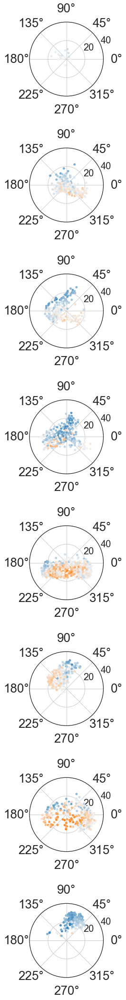

In [406]:
f = plt.figure(figsize=(set_size(double_col_width, subplots=(len(row_order), 1))))

for i, lobe in enumerate(row_order):
    lobe_df = h2514.df.loc[h2514.df['lobe'] == lobe]
    ax = f.add_subplot(len(row_order), 1, i+1, projection='polar')

    im = ax.scatter(lobe_df['theta'], lobe_df['r'], s=15, 
                    c=q2[lobe_df.index], cmap=BuOr_mpl,
                    norm=offset_div_cmap(q2),
                    vmin=q2.min(), vmax=q2.max())
    
    ax.tick_params(axis='x', labelsize=26, pad=15)
    ax.tick_params(axis='y', labelsize=20) 
    ax.set_title('')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_ylim(0, 40)
    ax.set_yticks([20, 40])
    
f.subplots_adjust(hspace=0.7) # adjust spacing between rows
f.savefig(f'{path}/figures/2514-isomap-mmd-q2value-gradient-colormap.png', dpi=300)
f.savefig(f'{path}/figures/2514-isomap-mmd-q2value-gradient-colormap.svg', dpi=300)

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:210: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.


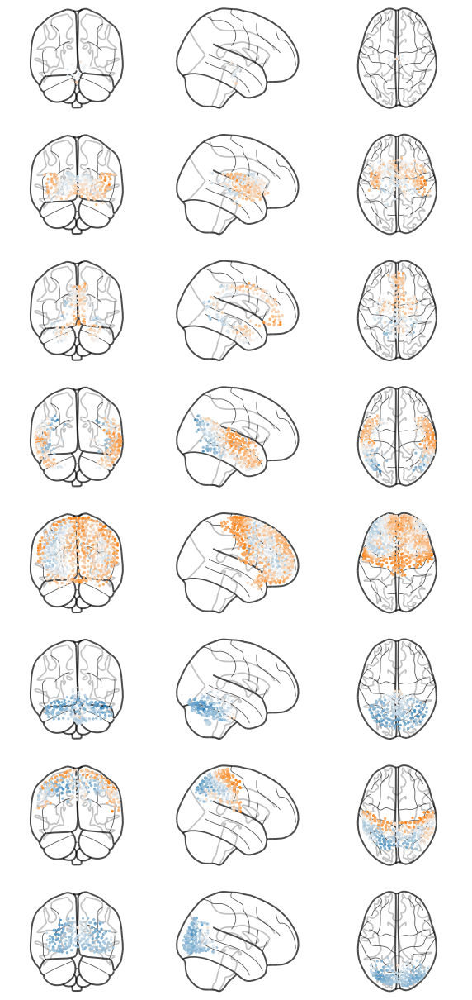

In [407]:
# Test using the third eigenvector to map color
f, ax = plt.subplots(nrows=len(lobes), figsize=(10, 22))

for i, lobe in enumerate(row_order):
    # Generate lobe data
    lobe_df = h2514.df.loc[h2514.df['lobe'] == lobe]
    lobe_xyz = lobe_df[['mni_x', 'mni_y', 'mni_z']].to_numpy()
    lobe_nw = h2514.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]
    
    # Build plot
    plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=5,
                    node_color=q3[lobe_df.index], colorbar=False, edge_threshold=1,
                    node_kwargs={'cmap': BuOr_mpl,
                                 'norm': offset_div_cmap(q3),
                                 'vmin': q3.min(),
                                 'vmax': q3.max()}, 
                    axes=ax[i], annotate=False)
    
f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet-q3value-gradient.png',
          dpi=300,
          bbox_inches='tight')
f.savefig(f'{path}/figures/2514-glass-brain-color-by-mmd-facet-q3value-gradient.svg',
          dpi=300,
          bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:210: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  # Remove the CWD from sys.path while we load stuff.


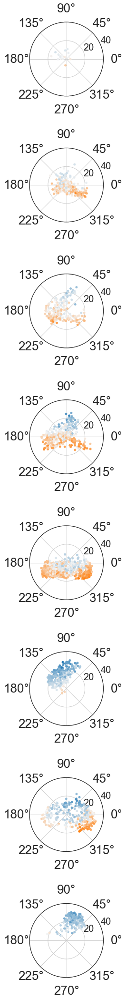

In [408]:
f = plt.figure(figsize=(set_size(double_col_width, subplots=(len(row_order), 1))))

for i, lobe in enumerate(row_order):
    lobe_df = h2514.df.loc[h2514.df['lobe'] == lobe]
    ax = f.add_subplot(len(row_order), 1, i+1, projection='polar')

    im = ax.scatter(lobe_df['theta'], lobe_df['r'], s=15, 
                    c=q3[lobe_df.index], cmap=BuOr_mpl,
                    norm=offset_div_cmap(q3),
                    vmin=q3.min(), vmax=q3.max())
    
    ax.tick_params(axis='x', labelsize=26, pad=15)
    ax.tick_params(axis='y', labelsize=20) 
    ax.set_title('')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_ylim(0, 40)
    ax.set_yticks([20, 40])
    
f.subplots_adjust(hspace=0.7) # adjust spacing between rows
f.savefig(f'{path}/figures/2514-isomap-mmd-q3value-gradient-colormap.png', dpi=300)
f.savefig(f'{path}/figures/2514-isomap-mmd-q3value-gradient-colormap.svg', dpi=300)

## Get number of regions within each module

In [166]:
counts = ((h2514.df.copy()
          .groupby(['lobe', 'mod'], as_index=False)
          .agg(['count']))['roi']
          .reset_index())

counts['mod'] = counts['mod'].astype('category')
counts['lobe'] = pd.Categorical(counts['lobe'], 
                                categories=reversed(list(row_order)), 
                                ordered=True)
counts

,lobe,mod,count
0,Brainstem,0,5
1,Brainstem,1,11
2,Cerebellum,0,69
3,Cerebellum,1,189
4,Frontal Lobe,0,371
5,Frontal Lobe,1,438
6,Limbic Lobe,0,70
7,Limbic Lobe,1,150
8,Occipital Lobe,0,171
9,Occipital Lobe,1,34


In [167]:
counts2 = counts.set_index('lobe').pivot(columns='mod', values='count')
counts2

mod,0,1
lobe,,
Occipital Lobe,171,34
Parietal Lobe,256,87
Cerebellum,69,189
Frontal Lobe,371,438
Temporal Lobe,136,233
Limbic Lobe,70,150
Sub-lobar,165,129
Brainstem,5,11


In [168]:
# Percent counts
mod0 = counts2.iloc[:, 0].reset_index(drop=True)
mod1 = counts2.iloc[:, 1].reset_index(drop=True)

percs = pd.DataFrame({'lobe': pd.Series(reversed(row_order)),
                               'mod0': mod0, 
                               'mod1': mod1})

percs['per0'] = (percs['mod0'] / (percs['mod0'] + percs['mod1'])) * 100
percs['per1'] = 100 - percs['per0']

percs = percs[['lobe', 'per0', 'per1']].set_index('lobe')
percs

,per0,per1
lobe,,
Occipital Lobe,83.414634,16.585366
Parietal Lobe,74.635569,25.364431
Cerebellum,26.744186,73.255814
Frontal Lobe,45.859085,54.140915
Temporal Lobe,36.856369,63.143631
Limbic Lobe,31.818182,68.181818
Sub-lobar,56.122449,43.877551
Brainstem,31.250000,68.750000


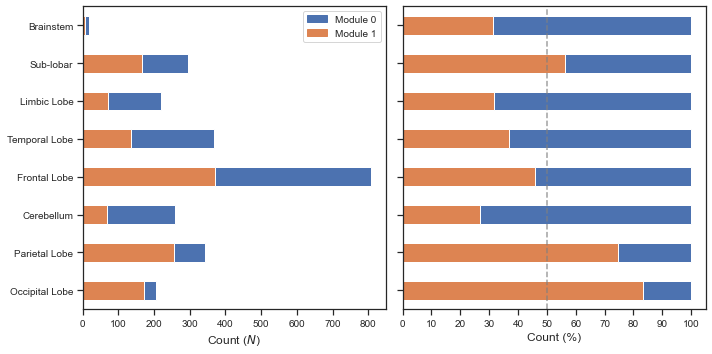

In [169]:
# Build plot
colors = create_N_colors(2, palette=sns.color_palette())
sns_blue = colors[0]
sns_orange = colors[1]
kcolors = np.vstack([sns_orange, sns_blue])

f, ax = plt.subplots(ncols=2, figsize=(10, 6))

# Color labels
counts2.plot(kind='barh', stacked=True, ax=ax[0], color=kcolors)
percs.plot(kind='barh', stacked=True, ax=ax[1], color=kcolors)

# Plot aesthetics
ax[0].set_aspect(square_ax(ax[0]))
ax[0].get_legend().remove()
ax[0].set_ylabel('')
ax[0].set_xlabel('Count ($N$)')

ax[1].axvline(x=50, color='gray', linestyle='--', alpha=0.75)
ax[1].set_aspect(square_ax(ax[1]))
ax[1].get_legend().remove()
ax[1].set_xticks(np.arange(101, step=10))
ax[1].set_xticklabels(np.arange(101, step=10))
ax[1].set_yticklabels([])
ax[1].set_ylabel('')
ax[1].set_xlabel('Count (%)')

# Custom legend
blue_bar = matplotlib.patches.Patch(color=colors[0], label='Module 0')
orange_bar = matplotlib.patches.Patch(color=colors[1], label='Module 1')

ax[0].legend(handles=[blue_bar, orange_bar], loc='upper right')

f.tight_layout()
f.savefig(f'{path}/figures/count-and-percentages-by-module.png', dpi=300)
f.savefig(f'{path}/figures/count-and-percentages-by-module.svg', dpi=300)

In [170]:
all_counts = h2514.df.groupby('mod').agg('count').reset_index()[['mod', 'roi']]
all_counts

,mod,roi
0,0,1243
1,1,1271


In [171]:
percs_all = np.array([1243/2514, 1271/2514]) * 100
percs_all_df = pd.DataFrame({'perc': percs_all, 'mod': ['0', '1']})
percs_all_df

,perc,mod
0,49.443119,0
1,50.556881,1


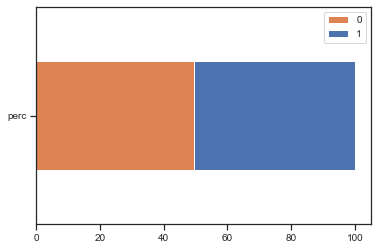

In [172]:
# Mod 0 is defined as q_i > 0
# Mod 1 is defined as q_i < 0
# However, the BuOr_mpl colormap is [blue - white - orange], where lower q_i is blue,
# and higher q_i is orange
# To be consistent with BuOr_mpl colormap, discrete mod colors should be assigned such
# that Mod 0 = orange, Mod 1 = blue

f, ax = plt.subplots()
percs_all_df.set_index('mod').T.plot(kind='barh', stacked=True, ax=ax, color=kcolors)
ax.get_legend().remove()
ax.set_ylabel('')
ax.legend()
f.savefig(f'{path}/figures/percent-by-module.svg', dpi=300)

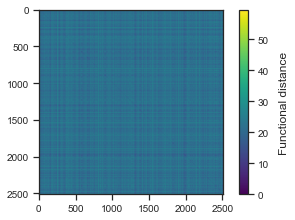

In [20]:
# All isomap pairwise distances
f, ax = plt.subplots(figsize=set_size(onehalf_col_width))
im = ax.imshow(edist(h2514.isomap), cmap='viridis')
cbar = f.colorbar(im, ax=ax)
cbar.set_label('Functional distance', fontsize=12, labelpad=10)

f.savefig(f'{path}/figures/pairwise-embedding-distance-heatmap.pdf', 
          dpi=300, bbox_inches='tight')

Get mean hemisphere hippocampus coordinates in isomap embedding.

## Frontal lobe distance distributions

In [62]:
# Peaks of frontal lobe
frontal = h2514.df.loc[h2514.df['lobe'] == 'Frontal Lobe']
frontal_median = medians.loc[medians['lobe'] == 'Frontal Lobe', 'D'].item()
frontal_lower = frontal.loc[frontal['D'] < frontal_median]
frontal_higher = frontal.loc[frontal['D'] > frontal_median]

frontal_lower.groupby(['roi']).agg(['count'])

,x,y,theta,r,D,mod,mni_x,mni_y,mni_z,lobe,hemi
,count,count,count,count,count,count,count,count,count,count,count
roi,,,,,,,,,,,
Caudate,1,1,1,1,1,1,1,1,1,1,1
Cingulum Ant,1,1,1,1,1,1,1,1,1,1,1
Cingulum Mid,6,6,6,6,6,6,6,6,6,6,6
Frontal Inf Oper,12,12,12,12,12,12,12,12,12,12,12
Frontal Inf Orb,24,24,24,24,24,24,24,24,24,24,24
Frontal Inf Tri,58,58,58,58,58,58,58,58,58,58,58
Frontal Med Orb,3,3,3,3,3,3,3,3,3,3,3
Frontal Mid,112,112,112,112,112,112,112,112,112,112,112


In [63]:
frontal_higher_counts = (frontal_higher
 .groupby(['roi'])
 .agg(['count'])['theta']
 .sort_values('count').tail(10))

frontal_higher_counts

,count
roi,
Frontal Inf Orb,13
Frontal Inf Oper,13
Rolandic Oper,14
Paracentral Lobule,19
Postcentral,25
Supp Motor Area,39
Frontal Mid,45
Precentral,58
Frontal Sup Medial,64


In [64]:
frontal_lower_counts = (frontal_lower
 .groupby(['roi'])
 .agg(['count'])['theta']
 .sort_values('count').tail(10))

frontal_lower_counts

,count
roi,
Frontal Inf Oper,12
Temporal Pole Sup,17
Supp Motor Area,22
Precentral,24
Frontal Inf Orb,24
Frontal Sup Orb,28
Frontal Mid Orb,28
Frontal Sup,36
Frontal Inf Tri,58


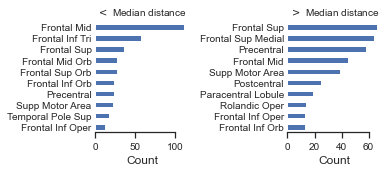

In [71]:
w, h = set_size(onehalf_col_width, subplots=(1, 2))
f, ax = plt.subplots(figsize=(w, 2.5), ncols=2)

frontal_lower_counts.plot(kind='barh', ax=ax[0], legend=False)
frontal_higher_counts.plot(kind='barh', ax=ax[1], legend=False)
ax[0].set_ylabel('')
ax[1].set_ylabel('')
ax[0].set_xlabel('Count')
ax[1].set_xlabel('Count')
sns.despine(left=True, trim=True)
ax[0].tick_params(axis='y', size=0, labelsize=10)
ax[1].tick_params(axis='y', size=0, labelsize=10)
ax[0].set_title('$<$ Median distance', fontsize=10)
ax[1].set_title('$>$ Median distance', fontsize=10)

f.tight_layout()
f.savefig(f'{path}/figures/frontal-lobe-above-below-median.png', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/frontal-lobe-above-below-median.svg', dpi=300, bbox_inches='tight')

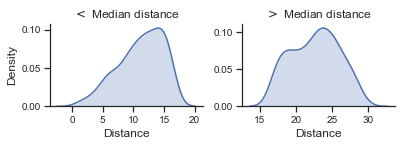

In [100]:
f, ax = plt.subplots(figsize=set_size(onehalf_col_width, subplots=(1, 2)), ncols=2)
sns.kdeplot(frontal_lower['r'], shade=True, ax=ax[0], legend=False)
sns.kdeplot(frontal_higher['r'], shade=True, ax=ax[1], legend=False)
f.tight_layout()
ax[0].set_xlabel('Distance')
ax[1].set_xlabel('Distance')
ax[0].set_ylabel('Density')
ax[0].set_title('$<$ Median distance', fontsize=12)
ax[1].set_title('$>$ Median distance', fontsize=12)
sns.despine()
f.savefig(f'{path}/figures/frontal-above-below-median-kdeplot.png',
         dpi=300, bbox_inches='tight')

f.savefig(f'{path}/figures/frontal-above-below-median-kdeplot.svg',
         dpi=300, bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:210: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.


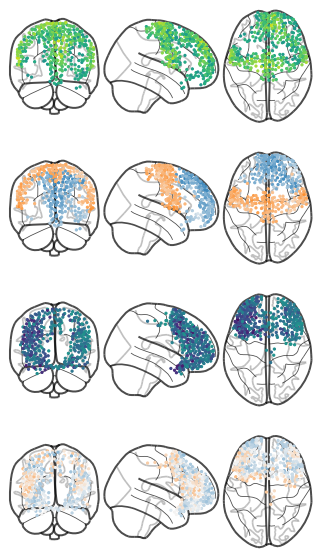

In [83]:
fh_nw = h2514.avg_nw[np.ix_(frontal_higher.index, frontal_higher.index)]
fh_xyz = h2514.roi_xyz.iloc[frontal_higher.index]

w, h = set_size(onehalf_col_width)
f, ax = plt.subplots(nrows=4, figsize=(w, 10))

s = 5

# Higher 
# ------
# Color radius
plot_connectome(fh_nw,
                node_coords=fh_xyz,
                node_size=s,
                node_color=frontal_higher['r'].to_numpy(),
                node_kwargs={'cmap': 'viridis', 'vmin': 0, 'vmax': h2514.df['r'].max()},
                edge_threshold=1,
                #title='Regions $>$ median frontal lobe distance', 
                black_bg=False,
                annotate=False, axes=ax[0])

#plt.savefig(f'{path}/figures/frontal-lobe-higher-glass-brain.png', dpi=300, bbox_inches='tight')

# Color mod
plot_connectome(fh_nw,
                node_coords=fh_xyz,
                node_size=s,
                node_color=h2514.qmax[frontal_higher.index.to_numpy()],
                node_kwargs={'cmap': BuOr_mpl,
                'norm': offset_div_cmap(h2514.qmax),
                'vmin': h2514.qmax.min(),
                'vmax': h2514.qmax.max()},
                edge_threshold=1,
                #title='Regions $>$ median frontal lobe distance', 
                black_bg=False,
                annotate=False, axes=ax[1])

#plt.savefig(f'{path}/figures/frontal-lobe-higher-glass-brain-mmd.png', dpi=300, bbox_inches='tight')


# Lower
# -----

# Color radius
fl_nw = h2514.avg_nw[np.ix_(frontal_lower.index, frontal_lower.index)]
fl_xyz = h2514.roi_xyz.iloc[frontal_lower.index]

plot_connectome(fl_nw,
                node_coords=fl_xyz,
                node_size=s,
                node_color=frontal_lower['r'].to_numpy(),
                node_kwargs={'cmap': 'viridis', 'vmin': 0, 'vmax': h2514.df['r'].max()},
                edge_threshold=1,
                #title='Regions $<$ median frontal lobe distance', 
                black_bg=False,
                annotate=False, axes=ax[2])

#plt.savefig(f'{path}/figures/frontal-lobe-lower-glass-brain.png', dpi=300, bbox_inches='tight')

# Color mod
plot_connectome(fl_nw,
                node_coords=fl_xyz,
                node_size=s,
                node_color=h2514.qmax[frontal_lower.index.to_numpy()],
                node_kwargs={'cmap': BuOr_mpl,
                'norm': offset_div_cmap(h2514.qmax),
                'vmin': h2514.qmax.min(),
                'vmax': h2514.qmax.max()}, 
                edge_threshold=1,
                #title='Regions $<$ median frontal lobe distance', 
                black_bg=False,
                annotate=False, axes=ax[3])

f.savefig(f'{path}/figures/frontal-lobe-lower-glass-brain-mmd.png', 
          dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/frontal-lobe-lower-glass-brain-mmd.svg', 
          dpi=300, bbox_inches='tight')

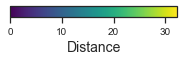

In [99]:
f, ax = plt.subplots(figsize=(3, 0.2))

cmap = matplotlib.cm.viridis
norm = matplotlib.colors.Normalize(vmin=0, vmax=h2514.df['r'].max())
cbar = f.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap),
                  cax=ax, orientation='horizontal')

cbar.ax.tick_params(labelsize=10)
cbar.ax.set_xlabel('Distance', fontsize=14)
f.savefig(f'{path}/figures/frontal-lobe-distance-colorbar.svg', dpi=300)

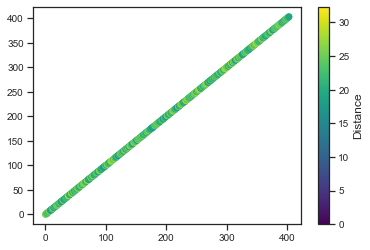

In [85]:
# Save colorbar for glass brain plots
plt.scatter(np.arange(len(frontal_higher)), np.arange(len(frontal_higher)), 
           c=frontal_higher['r'], cmap='viridis', vmin=0, vmax=h2514.df['r'].max())

plt.colorbar(label='Distance')
plt.savefig(f'{path}/figures/frontal-lobe-higher-distance-cbar.svg', dpi=300)

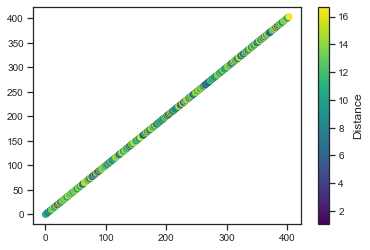

In [187]:
# Save colorbar for glass brain plots
plt.scatter(np.arange(len(frontal_lower)), np.arange(len(frontal_lower)), 
           c=frontal_lower['r'], cmap='viridis')

plt.colorbar(label='Distance')
plt.savefig(f'{path}/figures/frontal-lobe-lower-distance-cbar.png', dpi=300)

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:207: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  # This is added back by InteractiveShellApp.init_path()


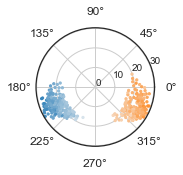

In [188]:
# Plot isomap embedding of frontal lobe regions w/ distance higher/lower than median
f, ax = plt.subplots(figsize=set_size(single_col_width), subplot_kw={'projection': 'polar'})

fh_polar = h2514.df.iloc[frontal_higher.index]
fl_polar = h2514.df.iloc[frontal_lower.index]

ax.scatter(fh_polar['theta'],
           fh_polar['r'],
           s=5, c=h2514.qmax[frontal_higher.index.to_numpy()], 
           cmap=BuOr_mpl, norm=offset_div_cmap(h2514.qmax), 
           vmin=h2514.qmax.min(), vmax=h2514.qmax.max())

ax.set_yticks(np.arange(31, step=10))
ax.tick_params(axis='x', labelsize=12)

f.savefig(f'{path}/figures/frontal-lobe-higher-isomap.png', dpi=300, bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:207: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  import sys


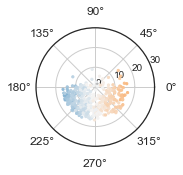

In [189]:
f, ax = plt.subplots(figsize=set_size(single_col_width), subplot_kw={'projection': 'polar'})

ax.scatter(fl_polar['theta'],
           fl_polar['r'],
           s=5, c=h2514.qmax[frontal_lower.index.to_numpy()], 
           cmap=BuOr_mpl, norm=offset_div_cmap(h2514.qmax), 
           vmin=h2514.qmax.min(), vmax=h2514.qmax.max())

ax.set_yticks(np.arange(31, step=10))
ax.tick_params(axis='x', labelsize=12)

f.savefig(f'{path}/figures/frontal-lobe-lower-isomap.png', dpi=300, bbox_inches='tight')

## Region gradients

In [190]:
def mean_src_dist(df, src_name, lookup_in='roi'):
    """Compute the Euclidean distance to the mean coordinate
    of ROI or lobe in the isomap embedding.
    
    Parameters
    ----------
    df : pandas dataframe
        Dataframe containing the Cartesian and polar 2D coordinates
        for N regions, region names, and lobe names. 
        
    src_name : string
        Name of region or lobe to compute distance to.
        
    lookup_in : string ('roi' or 'lobe')
        Choose whether src_name is in the 'roi' or 'lobe' column.
        
    Returns
    -------
    dist_to_src : numpy vector
        Vector of distances to mean src_name coordinate.
    """
    
    src_xy = (df
              .loc[df[lookup_in] == src_name, ['x', 'y']]
              .mean(axis=0)
              .to_numpy()
              .reshape(1, 2))

    dist_to_src = edist(df[['x', 'y']].to_numpy(), src_xy)
    
    return dist_to_src

### Hippocampus

In [191]:
src_dist = h2514.df.copy()
src_dist['hippo-dist'] = mean_src_dist(src_dist, 'Hippocampus')

closest_to_src = src_dist.sort_values('hippo-dist').head(n=100)

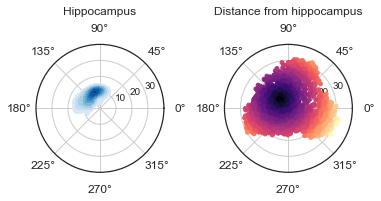

In [193]:
width_in, height_in = set_size(onehalf_col_width, subplots=(1, 2))
f = plt.figure(figsize=(width_in, 3))
ax0 = f.add_subplot(121, projection='polar')

# Hippocampus kdeplot
sns.kdeplot(src_dist.loc[src_dist['roi'] == 'Hippocampus', 'theta'],
            src_dist.loc[src_dist['roi'] == 'Hippocampus', 'r'],
            cmap='Blues', shade=True, shade_lowest=False, ax=ax0)

ax0.tick_params(axis='x', labelsize=12)
ax0.tick_params(axis='y', labelsize=10)
ax0.set_ylim(0, 40)
ax0.set_yticks(np.arange(10, 40, step=10))
ax0.set_yticklabels([10, 20, 30])
ax0.set_xlabel('')
ax0.set_ylabel('')
ax0.set_title('Hippocampus', pad=30, fontsize=12)
ax0.set_aspect('equal')

# Distance from hippocampus
ax1 = f.add_subplot(122, projection='polar')

im = ax1.scatter(x=src_dist['theta'], y=src_dist['r'], s=15,
                c=src_dist['hippo-dist'], cmap='magma')

ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=10)
ax1.set_aspect('equal')
ax1.set_title('Distance from hippocampus', pad=30, fontsize=12)
ax1.set_ylim(0, 40)
ax1.set_yticks(np.arange(10, 40, step=10))
ax1.set_yticklabels([10, 20, 30])

f.tight_layout()
f.subplots_adjust(right=0.9)

f.savefig(f'{path}/figures/isomap-dist-from-hippo.pdf', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/isomap-dist-from-hippo.svg', dpi=300, bbox_inches='tight')

### Occipital lobe

In [198]:
src_dist['occ-dist'] = mean_src_dist(src_dist, 'Occipital Lobe', lookup_in='lobe')

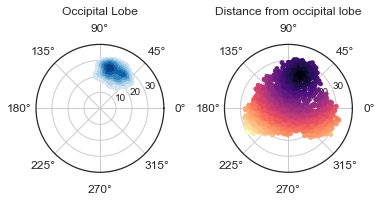

In [199]:
width_in, height_in = set_size(onehalf_col_width, subplots=(1, 2))
f = plt.figure(figsize=(width_in, 3))
ax0 = f.add_subplot(121, projection='polar')

# Occipital lobe kdeplot
sns.kdeplot(src_dist.loc[src_dist['lobe'] == 'Occipital Lobe', 'theta'],
            src_dist.loc[src_dist['lobe'] == 'Occipital Lobe', 'r'],
            cmap='Blues', shade=True, shade_lowest=False, ax=ax0)

ax0.tick_params(axis='x', labelsize=12)
ax0.tick_params(axis='y', labelsize=10)
ax0.set_ylim(0, 40)
ax0.set_yticks(np.arange(10, 40, step=10))
ax0.set_yticklabels([10, 20, 30])
ax0.set_xlabel('')
ax0.set_ylabel('')
ax0.set_title('Occipital Lobe', pad=30, fontsize=12)
ax0.set_aspect('equal')

# Distance from occipital lobe
ax1 = f.add_subplot(122, projection='polar')

im = ax1.scatter(x=src_dist['theta'], y=src_dist['r'], s=15,
                 c=src_dist['occ-dist'], cmap='magma')

ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=10)
ax1.set_aspect('equal')
ax1.set_title('Distance from occipital lobe', pad=30, fontsize=12)
ax1.set_ylim(0, 40)
ax1.set_yticks(np.arange(10, 40, step=10))
ax1.set_yticklabels([10, 20, 30])

f.tight_layout()
f.subplots_adjust(right=0.9)

f.savefig(f'{path}/figures/isomap-dist-from-occ.png', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/isomap-dist-from-occ.svg', dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/isomap-dist-from-occ.pdf', dpi=300, bbox_inches='tight')

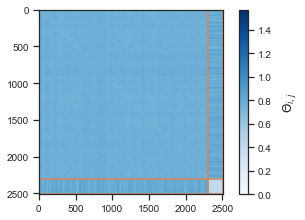

In [203]:
occ_mask = (src_dist['lobe'] == 'Occipital Lobe').to_numpy().astype(int)

bounds, ixes = bct.grid_communities(occ_mask)

f, ax = plt.subplots(figsize=set_size(onehalf_col_width))

im = ax.imshow(h2514.theta[np.ix_(ixes, ixes)], cmap='Blues')

for b in bounds:
    ax.axvline(x=b,color='C1')
    ax.axhline(y=b,color='C1')
    
cbar = f.colorbar(im, ax=ax)
cbar.set_label('$\\Theta_{i,j}$', fontsize=12, labelpad=10)

f.savefig(f'{path}/figures/2514-theta-sorted-by-occipital-lobe.pdf', 
          dpi=300, bbox_inches='tight')

### Precuneus

In [204]:
src_dist['precun-dist'] = mean_src_dist(src_dist, 'Precuneus')

(0.0, 40.0)

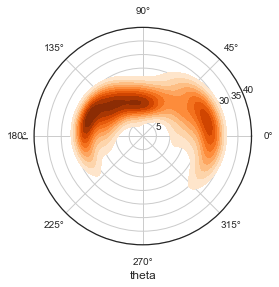

In [205]:
f = plt.figure()
ax = f.add_subplot(projection='polar')

sns.kdeplot(src_dist.loc[src_dist['roi'] == 'Precuneus', 'theta'],
            src_dist.loc[src_dist['roi'] == 'Precuneus', 'r'],
           cmap='Oranges', shade=True, shade_lowest=False)

ax.set_ylim(0, 40)

## Distance to origin surface maps

In [208]:
def roi_to_vol(xyz, values):
    """Creates 3D volume of ROI points in MNI grid space that
    have associated data values (i.e., each (x,y,z)-coordinate has
    a single value associated with it). The 3D volume is then interpolated
    and a new NIfTI image is created that is registered to the MNI 
    template image. The resulting NIfTI image can then be visualized
    as a cortical surface plot using plotting tools from Nilearn.
    
    Parameters
    ----------
    xyz : numpy array
        Nx4 array containing the MNI (x,y,z)-coordinates for each ROI.
        
    values : numpy vector
        Numpy vector of length N containing the data value associated with
        each ROI.
        
    name : string
        Name of region (used for saving filenames).
        
    Returns
    -------
    grid_val : numpy array
        3D array containing the interpolated ROI data.
    """
    
    def row_isin(row, array):
        """Check if 1xM row is in NxM array."""
        return any(np.array_equal(row, x) for x in array)
    
    """Create 3D volume"""
    # ROI coordinates
    x = xyz[:, 0]
    y = xyz[:, 1]
    z = xyz[:, 2]
    
    # 3D grid point ranges
    X = np.arange(x.min(), x.max()+1)
    Y = np.arange(y.min(), y.max()+1)
    Z = np.arange(z.min(), z.max()+1)

    V = np.zeros([len(X), len(Y), len(Z)])  # 3D volume with ROI data

    # Covnvert (x,y,z) data points to indices of V
    xd = dict(zip(X, np.arange(len(X))))
    yd = dict(zip(Y, np.arange(len(Y))))
    zd = dict(zip(Z, np.arange(len(Z))))

    data_idx = pd.DataFrame({'x': x, 'y': y, 'z': z})
    data_idx['xi'] = data_idx['x'].map(xd)
    data_idx['yi'] = data_idx['y'].map(yd)
    data_idx['zi'] = data_idx['z'].map(zd)

    V[data_idx['xi'], data_idx['yi'], data_idx['zi']] = values

    """Interpolation"""
    grid_x, grid_y, grid_z = np.mgrid[X.min():X.max(), Y.min():Y.max(), Z.min():Z.max()]
    
    grid_val = griddata(xyz, 
                        values, 
                        (grid_x, grid_y, grid_z), 
                        method='linear', 
                        fill_value=0)

    return grid_val


def vol_to_nii(vol, name, dof=12, **flirt_kws):
    """Register 3D interpolated volume output from `roi_to_vol` to the
    MNI template image.
    
    Parameters
    ----------
    vol : numpy array
        3D numpy array output from `roi_to_vol`.
        
    name : string
        Name of region for NIfTI output filename.
        
    dof : integer
        Number of degrees of freedom to use for registration (default = 12).
        
    **flirt_kws : dict
        Additional kwargs to pass to `fsl.FLIRT`.
        
    Returns
    -------
    reg_<name>.nii.gz : NIfTI file
        NIfTI file of volume registered to MNI space.
        
    out_file : string
        Path to output file.
    """
    
    # Save volume as NIfTI object
    template = fsl.Info.standard_image('MNI152_T1_1mm_brain.nii.gz')
    affine = np.eye(4)
    data_nii = nib.Nifti1Image(vol, affine=affine)
    nib.save(data_nii, f'{path}/data/saved_data/surface_maps/{name}.nii')
    
    # Register data map to MNI template
    out_file = f'{path}/data/saved_data/surface_maps/reg-{name}.nii.gz'
    
    reg = fsl.FLIRT(
        in_file=f'{path}/data/saved_data/surface_maps/{name}.nii',
        reference=template,
        output_type='NIFTI_GZ',
        out_file=out_file,
        out_matrix_file=f'{path}/data/saved_data/surface_maps/{name}-tm.mat',
        dof=dof,
        **flirt_kws)

    reg.run()
    
    return out_file
    
def plot_dist_surfmaps(nii, 
                       name,
                       mesh='fsaverage5', 
                       cmap='magma',
                       darkness=0.5,
                       save_cbar=True,
                       **surf_stat_map_kws):
    """Plot wrapper for `plot_surf_stat_map`.
    
    Parameters
    ----------
    nii : string
        Path to NIfTI volume (output from `vol_to_nii`).
        
    name : string
        Name of region to use for output files.
    
    mesh : string
        fsaverage mesh to use for `vol_to_surf`.
        
    cmap : string
        Colormap to use for `plot_surf_stat_map`.
        
    darkness : float
        Darkness value to use for `plot_surf_stat_map`.
        
    save_cbar : boolean
        If True, saves the colorbar as a separate SVG file.
        
    **surf_stat_map_kws : kwargs
        Additional kwargs to pass to `plot_surf_stat_map`.
    """
 
    fsaverage = datasets.fetch_surf_fsaverage(mesh=mesh)
    texture = surface.vol_to_surf(nii, fsaverage['pial_left'])
    views = ['lateral', 'medial', 'dorsal', 'ventral']

    for i, view in enumerate(views):

        f, ax = plt.subplots(figsize=set_size(345), subplot_kw={'projection': '3d'})

        im = plot_surf_stat_map(
            fsaverage['pial_left'],
            texture,
            hemi='left',
            view=view,
            colorbar=False,
            bg_map=fsaverage['sulc_left'],
            bg_on_data=True,
            cmap=cmap,
            darkness=darkness,
            figure=f,
            axes=ax,
            **surf_stat_map_kws)

        f.savefig(
            f'{path}/figures/surface_maps/{name}-{view}.png', 
            dpi=300, 
            bbox_inches='tight',
            pad_inches=0,
            transparent=True)

        
    # Right dorsal and ventral
    rh_texture = surface.vol_to_surf(nii, fsaverage['pial_right'])
    views = ['dorsal', 'ventral']

    for i, view in enumerate(views):

        f, ax = plt.subplots(figsize=set_size(345), subplot_kw={'projection': '3d'})

        im = plot_surf_stat_map(
            fsaverage['pial_right'],
            rh_texture,
            hemi='right',
            view=view,
            colorbar=False,
            bg_map=fsaverage['sulc_right'],
            bg_on_data=True,
            cmap=cmap,
            darkness=darkness,
            figure=f,
            axes=ax,
            **surf_stat_map_kws)

        f.savefig(
            f'{path}/figures/surface_maps/{name}-RH-{view}.png', 
            dpi=300, 
            bbox_inches='tight',
            pad_inches=0,
            transparent=True)
        
    if save_cbar is True:
        f = plt.figure()
        ax = f.add_subplot(projection='3d')

        im = plot_surf_stat_map(
            fsaverage['pial_left'],
            texture,
            hemi='left',
            view=view,
            colorbar=True,
            bg_map=fsaverage['sulc_left'],
            bg_on_data=True,
            cmap=cmap,
            darkness=darkness,
            figure=f,
            axes=ax,
            **surf_stat_map_kws)

        ax.remove()

        plt.ylabel('Distance')
        plt.savefig(
            f'{path}/figures/surface_maps/{name}-colorbar.svg', 
            dpi=300,
            transparent=True)
        
def surfmap(region, name):
    """Convenience function to wrap surface map plotting."""
    region_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=src_dist[region])
    region_nii = vol_to_nii(region_vol, name=name)
    plot_dist_surfmaps(region_nii,
                       name=name,
                       mesh='fsaverage',
                       cmap='magma')

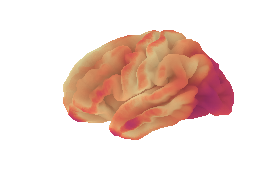

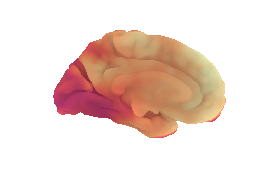

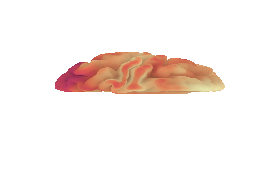

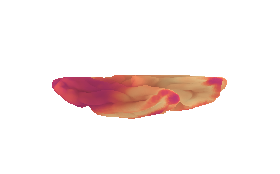

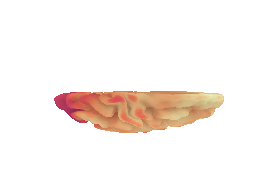

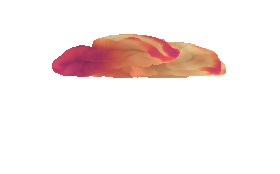

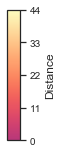

In [391]:
surfmap('occ-dist', 'occipital-lobe')

# occipital_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=src_dist['occ-dist'])
# occipital_nii = vol_to_nii(occipital_vol, name='occipital-lobe')
# plot_dist_surfmaps(occipital_nii, 
#                    name='occipital-lobe', 
#                    mesh='fsaverage', 
#                    cmap='magma')

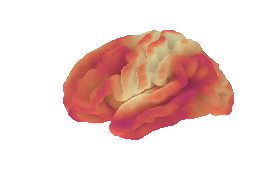

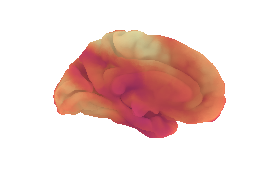

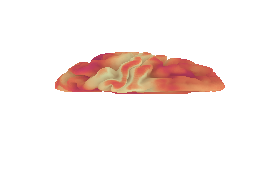

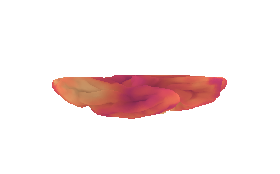

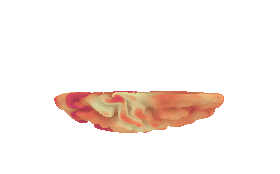

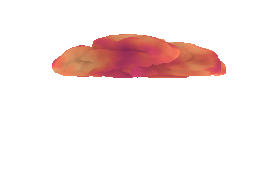

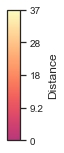

In [393]:
# Hippocampus
surfmap('hippo-dist', 'hippocampus')
# hippocampus_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=src_dist['hippo-dist'])
# hippocampus_nii = vol_to_nii(hippocampus_vol, name='hippocampus')
# plot_dist_surfmaps(hippocampus_nii, 
#                    name='hippocampus', 
#                    mesh='fsaverage', 
#                    cmap='magma')

## Precuneus

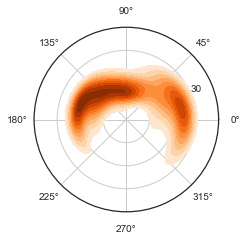

In [209]:
# Precuneus kdeplot
f = plt.figure(figsize=set_size(onehalf_col_width))

ax = f.add_subplot(projection='polar')

sns.kdeplot(src_dist.loc[src_dist['roi'] == 'Precuneus', 'theta'],
            src_dist.loc[src_dist['roi'] == 'Precuneus', 'r'],
           cmap='Oranges', shade=True, shade_lowest=False)

ax.set_aspect('equal')
#ax.set_title('', pad=30)
ax.set_ylim(0, 40)
ax.set_yticks(np.arange(10, 40, step=10))
ax.set_yticklabels([10, 20, 30])
ax.set_xlabel('')
ax.set_ylabel('')

f.savefig(f'{path}/figures/isomap-precuneus-kde.pdf', dpi=300, transparent=True)

In [210]:
# k-means to determine centroids of precuneus
precuneus_xy = src_dist.loc[src_dist['roi'] == 'Precuneus', ['x', 'y']].to_numpy()
precuneus_kmeans = KMeans(n_clusters=2, random_state=0).fit(precuneus_xy)

precuneus_df = src_dist.loc[src_dist['roi'] == 'Precuneus', 
                            ['x', 'y', 'r', 'theta']].copy()
precuneus_df['cluster'] = pd.Series(precuneus_kmeans.labels_, 
                                    dtype='category', 
                                    index=precuneus_df.index)

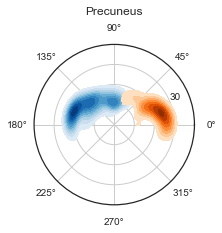

In [212]:
# Precuneus kdeplot

cluster0 = precuneus_df.loc[precuneus_df['cluster'] == 0]
cluster1 = precuneus_df.loc[precuneus_df['cluster'] == 1]

f = plt.figure(figsize=set_size(345))

ax = f.add_subplot(projection='polar')

sns.kdeplot(cluster0['theta'], cluster0['r'], cmap='Blues', shade=True, 
            shade_lowest=False, ax=ax)

sns.kdeplot(cluster1['theta'], cluster1['r'], cmap='Oranges', shade=True, 
            shade_lowest=False, ax=ax)

ax.set_aspect('equal')
ax.set_title('Precuneus', pad=30)
ax.set_ylim(0, 40)
ax.set_yticks(np.arange(10, 40, step=10))
ax.set_yticklabels([10, 20, 30])
ax.set_xlabel('')
ax.set_ylabel('')

f.savefig(f'{path}/figures/isomap-precuneus-kde-clusters.png', dpi=300, transparent=True)

In [214]:
centroid0 = precuneus_kmeans.cluster_centers_[0]
centroid1 = precuneus_kmeans.cluster_centers_[1]

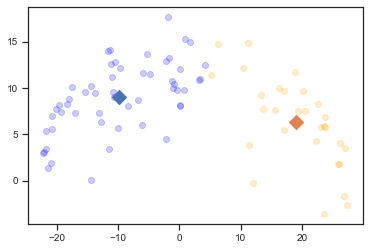

In [216]:
f, ax = plt.subplots()
ax.scatter(cluster0['x'], cluster0['y'], color='blue', alpha=0.2)

ax.scatter(centroid0[0],
           centroid0[1],
           color='C0',
           s=100,
           marker='D')

ax.scatter(cluster1['x'], cluster1['y'], color='orange', alpha=0.2)

ax.scatter(centroid1[0],
           centroid1[1],
           color='C1',
           s=100,
           marker='D')

In [218]:
src_dist['c0-precun'] = edist(src_dist[['x', 'y']].to_numpy(), 
                              centroid0.reshape(1, -1))

src_dist['c1-precun'] = edist(src_dist[['x', 'y']].to_numpy(), 
                              centroid1.reshape(1, -1))

In [403]:
precuneus_c0_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=src_dist['c0-precun'])
precuneus_c0_nii = vol_to_nii(precuneus_c0_vol, name='precuneus-c0')

precuneus_c1_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=src_dist['c1-precun'])
precuneus_c1_nii = vol_to_nii(precuneus_c1_vol, name='precuneus-c1')

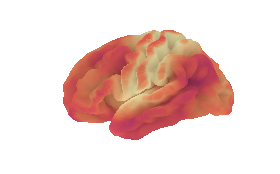

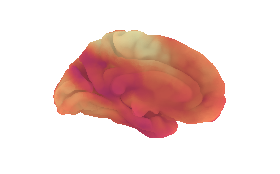

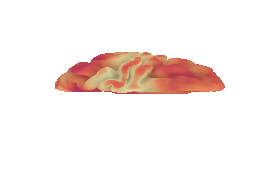

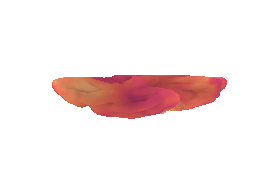

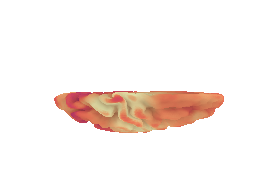

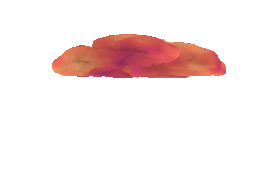

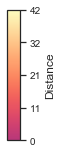

In [404]:
plot_dist_surfmaps(precuneus_c0_nii, 
                   name='precuneus-c0', 
                   mesh='fsaverage', 
                   cmap='magma')

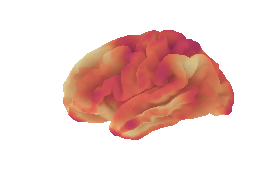

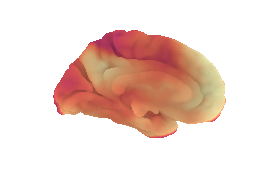

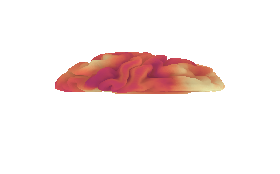

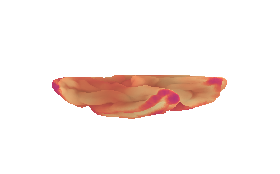

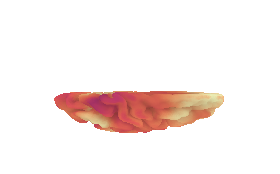

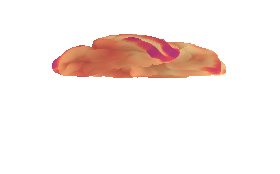

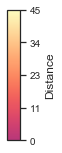

In [405]:
plot_dist_surfmaps(precuneus_c1_nii, 
                   name='precuneus-c1', 
                   mesh='fsaverage', 
                   cmap='magma')

## Diverging colormap for precuneus

In [219]:
c0_idx = precuneus_df.loc[precuneus_df['cluster'] == 0].index.to_numpy()
c1_idx = precuneus_df.loc[precuneus_df['cluster'] == 1].index.to_numpy()

In [220]:
def assign_cluster(c0_idx, c1_idx, df):
    """Assigns cluster affiliation to all regions in a dataset based on their
    distance to clusters based on a subset of the data.
    
    Parameters
    ----------
    c0_idx, c1_idx : numpy vector, pandas series
        Indices of the regions belonging to two previously determined clusters
        (e.g., from k-means). The indices must be in reference to the original
        N data.
        
    df : pandas dataframe
        Dataframe containing the (x,y)-coordinates for each region and the distance
        of each region to each of the cluster centroids
        
    Returns
    -------
    C : numpy vector
        Cluster assignment vector {0, 1} for each region.
    """
    
    c0_coords = df.iloc[c0_idx][['x', 'y']]
    c1_coords = df.iloc[c1_idx][['x', 'y']]
    region_coords = df[['x', 'y']].to_numpy()
    
    C = np.zeros(len(df))
    
    for i in range(len(region_coords)):
        d_c0_min = edist(c0_coords, region_coords[i].reshape(1, 2)).min()
        d_c1_min = edist(c1_coords, region_coords[i].reshape(1, 2)).min()
        
        if d_c1_min < d_c0_min:
            C[i] = 1
            
    return C   

src_dist['precuneus-cluster'] = pd.Series(assign_cluster(c0_idx, c1_idx, src_dist), dtype=int)


In [221]:
c0_dist = src_dist.loc[src_dist['precuneus-cluster'] == 0, 'c0-precun']
c0_dist = c0_dist.max() - c0_dist

c1_dist = src_dist.loc[src_dist['precuneus-cluster'] == 1, 'c1-precun']
c1_dist = c1_dist - c1_dist.max()

src_dist['precuneus-div'] = np.zeros(len(src_dist))
src_dist.loc[src_dist['precuneus-cluster'] == 0, 'precuneus-div'] = c0_dist
src_dist.loc[src_dist['precuneus-cluster'] == 1, 'precuneus-div'] = c1_dist

centroid_r, centroid_theta = coord_polar(precuneus_kmeans.cluster_centers_)

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  """


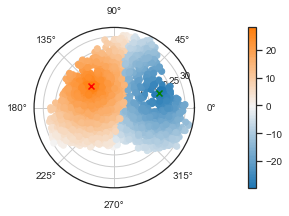

In [222]:
f, ax = plt.subplots(figsize=set_size(345), subplot_kw={'projection': 'polar'})

norm = matplotlib.colors.DivergingNorm(vmin=src_dist['precuneus-div'].min(),
                                       vcenter=0,
                                       vmax=src_dist['precuneus-div'].max())

im = ax.scatter(src_dist['theta'], src_dist['r'], c=src_dist['precuneus-div'], 
                cmap=BuOr_mpl, norm=norm)

ax.scatter(centroid_theta[0], centroid_r[0], color='red', marker='x')
ax.scatter(centroid_theta[1], centroid_r[1], color='green', marker='x')

f.colorbar(im, ax=ax, pad=0.2)
f.savefig(f'{path}/figures/isomap-precuneus-div.svg', dpi=300, transparent=True)

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.


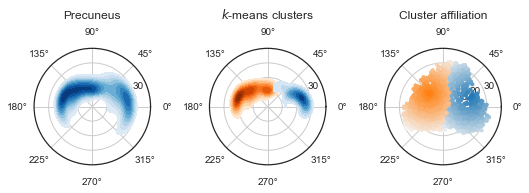

In [224]:
# Precuneus kdeplot
fig_width_in, _ = set_size(double_col_width, subplots=(1, 3))

f, ax = plt.subplots(1, 3, 
                     figsize=(fig_width_in, 3), 
                     subplot_kw={'projection': 'polar'})

# All precuneus regions combined
sns.kdeplot(src_dist.loc[src_dist['roi'] == 'Precuneus', 'theta'],
            src_dist.loc[src_dist['roi'] == 'Precuneus', 'r'],
            cmap='Blues', shade=True, shade_lowest=False, ax=ax[0])

ax[0].set_aspect('equal')
ax[0].set_ylim(0, 40)
ax[0].set_yticks(np.arange(10, 40, step=10))
ax[0].set_yticklabels([10, 20, 30])
ax[0].set_xlabel('')
ax[0].set_ylabel('')
ax[0].set_title('Precuneus', pad=30)

# Precuneus k-means clusters
cluster0 = precuneus_df.loc[precuneus_df['cluster'] == 0]
cluster1 = precuneus_df.loc[precuneus_df['cluster'] == 1]

sns.kdeplot(cluster0['theta'], cluster0['r'], cmap='Oranges', shade=True, 
            shade_lowest=False, ax=ax[1])

sns.kdeplot(cluster1['theta'], cluster1['r'], cmap='Blues', shade=True, 
            shade_lowest=False, ax=ax[1])

ax[1].set_aspect('equal')
ax[1].set_ylim(0, 40)
ax[1].set_yticks(np.arange(10, 40, step=10))
ax[1].set_yticklabels([10, 20, 30])
ax[1].set_xlabel('')
ax[1].set_ylabel('')
ax[1].set_title('$k$-means clusters', pad=30)

# Metaclusters
norm = matplotlib.colors.DivergingNorm(vmin=src_dist['precuneus-div'].min(),
                                       vcenter=0,
                                       vmax=src_dist['precuneus-div'].max())

im = ax[2].scatter(src_dist['theta'], src_dist['r'], c=src_dist['precuneus-div'], 
                   cmap=BuOr_mpl, norm=norm, s=10)

ax[2].set_aspect('equal')
ax[2].set_ylim(0, 40)
ax[2].set_yticks(np.arange(10, 40, step=10))
ax[2].set_yticklabels([10, 20, 30])
ax[2].set_title('Cluster affiliation', pad=30)

f.tight_layout()

f.savefig(f'{path}/figures/isomap-precuneus-all-and-kmeans.pdf', dpi=300)

In [226]:
# Get MNI coordinates of ROI closest to centroid for each cluster
c0_closest_idx = (src_dist
                  .sort_values('c0-precun')
                  .loc[src_dist['roi'] == 'Precuneus']
                  .index[0])

c1_closest_idx = (src_dist
                  .sort_values('c1-precun')
                  .loc[src_dist['roi'] == 'Precuneus']
                  .index[0])
c1_closest_idx

precun_closest_mni = h2514.roi_xyz.iloc[[c0_closest_idx, c1_closest_idx], :]
precun_closest_mni

,x,y,z
1201,9,-45,11
2485,8,-51,61


In [227]:
c0_count = (src_dist
            .loc[src_dist['precuneus-cluster'] == 0]
            .sort_values('c0-precun')
            .groupby('lobe')
            .size()
            .sort_values()
            .reset_index()
            .rename(columns={0: 'N'}))

c0_count

,lobe,N
0,Brainstem,15
1,Occipital Lobe,73
2,Parietal Lobe,104
3,Limbic Lobe,174
4,Sub-lobar,189
5,Cerebellum,236
6,Temporal Lobe,290
7,Frontal Lobe,469


In [228]:
c0_roi_count = (src_dist
                .loc[src_dist['precuneus-cluster'] == 0]
                .sort_values('c0-precun')
                .groupby('roi')
                .size()
                .sort_values()
                .tail(n=10)
                .reset_index()
                .rename(columns={0: 'N'}))

c0_roi_count

,roi,N
0,Caudate,48
1,Thalamus,52
2,Precuneus,54
3,Fusiform,55
4,Frontal Sup,73
5,Frontal Sup Medial,76
6,Temporal Inf,89
7,Frontal Mid,112
8,Temporal Mid,113
9,Cerebellum,177


In [229]:
c0_roi_means = (src_dist
                .loc[src_dist['precuneus-cluster'] == 0, ['roi', 'lobe', 'precuneus-div']]
                .groupby('roi')
                .agg(['mean'])
                .sort_values(('precuneus-div', 'mean'), ascending=False)
                .head(n=10)
)

c0_roi_means

,precuneus-div
,mean
roi,
Hippocampus,21.014246
Cuneus,20.996839
Vermis,20.680380
Precuneus,20.570938
Cerebellum,19.986254
ParaHippocampal,19.553908
Cingulum Post,18.961932
Calcarine,18.128343


In [230]:
c0_roi_strip = (src_dist
                .loc[src_dist['roi'].isin(c0_roi_means.index) &
                     (src_dist['precuneus-cluster'] == 0), ['roi', 'precuneus-div']]
               )

c0_roi_strip

,roi,precuneus-div
1,ParaHippocampal,20.053066
9,Cerebellum,19.956632
14,Cerebellum,21.728700
20,Hippocampus,20.424405
41,Cerebellum,16.761766
56,Cerebellum,19.786876
59,Cerebellum,20.103487
64,Cerebellum,18.157322
78,Calcarine,19.435153
88,Hippocampus,23.503950


In [231]:
c1_count = (src_dist
            .loc[src_dist['precuneus-cluster'] == 1]
            .sort_values('c1-precun')
            .groupby('lobe')
            .size()
            .sort_values()
            .reset_index()
            .rename(columns={0: 'N'}))
c1_count

,lobe,N
0,Brainstem,1
1,Cerebellum,22
2,Limbic Lobe,46
3,Temporal Lobe,79
4,Sub-lobar,105
5,Occipital Lobe,132
6,Parietal Lobe,239
7,Frontal Lobe,340


In [232]:
c1_roi_count = (src_dist
                .loc[src_dist['precuneus-cluster'] == 1]
                .sort_values('c1-precun')
                .groupby('roi')
                .size()
                .sort_values()
                .tail(n=10)
                .reset_index()
                .rename(columns={0: 'N'}))

c1_roi_count

,roi,N
0,Parietal Sup,38
1,Occipital Mid,38
2,SupraMarginal,40
3,Cingulum Mid,42
4,Frontal Mid,45
5,Insula,49
6,Supp Motor Area,50
7,Temporal Sup,53
8,Precentral,85
9,Postcentral,97


In [233]:
c1_roi_means = (src_dist
                .loc[src_dist['precuneus-cluster'] == 1, ['roi', 'lobe', 'precuneus-div']]
                .groupby('roi')
                .agg(['mean'])
                .sort_values(('precuneus-div', 'mean'))
                .head(n=10)
)

c1_roi_means

,precuneus-div
,mean
roi,
Precuneus,-23.078422
Parietal Sup,-21.899656
Cuneus,-18.366174
Angular,-17.820462
Paracentral Lobule,-16.823425
Temporal Mid,-15.905621
Thalamus,-15.745483
Temporal Inf,-15.422076


In [234]:
c1_roi_strip = (src_dist
                .loc[src_dist['roi'].isin(c1_roi_means.index) &
                     (src_dist['precuneus-cluster'] == 1), ['roi', 'precuneus-div']]
               )

c1_roi_strip

,roi,precuneus-div
3,Cuneus,-15.617378
10,Temporal Mid,-14.042162
29,Parietal Inf,-11.341403
39,Precuneus,-25.255976
51,Paracentral Lobule,-16.250539
53,Parietal Sup,-23.366019
60,Parietal Inf,-21.500811
81,Temporal Sup,-14.064905
87,Parietal Inf,-25.168724
97,Precuneus,-26.408200


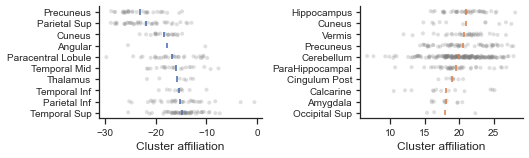

In [235]:
f, ax = plt.subplots(1, 2, figsize=set_size(double_col_width, subplots=(1, 2)))

strip_data = [c1_roi_strip, c0_roi_strip]
point_data = [c1_roi_means, c0_roi_means]
colors = ['C0', 'C1']

# Cluster 1
for i in range(2):
    sns.stripplot(data=strip_data[i], 
                  x='precuneus-div', 
                  y='roi', 
                  order=point_data[i].index,
                  color='gray',
                  size=4,
                  alpha=0.25,
                  zorder=1, 
                  ax=ax[i])

    sns.pointplot(x=point_data[i][('precuneus-div', 'mean')], 
                  y=point_data[i].index, 
                  color=colors[i], 
                  markers='|',
                  scale=0.8,
                  join=False,
                  ax=ax[i])

for axx in ax:
    axx.tick_params(axis='y', size=4)
    axx.set(xlabel='Cluster affiliation', ylabel='')

    sns.despine(f)

f.tight_layout()
f.savefig(f'{path}/figures/precuneus-10roi-near-centroids.svg', dpi=300)

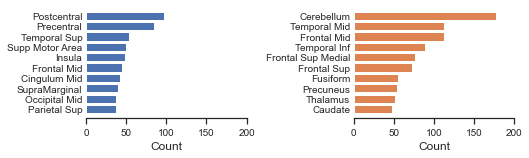

In [236]:
fig_width_in, fig_height_in = set_size(double_col_width, subplots=(1, 2))

f, ax = plt.subplots(1, 2, 
                     figsize=(fig_width_in, fig_height_in))

ax[0].barh(c1_roi_count['roi'], c1_roi_count['N'], color='C0')

ax[1].barh(c0_roi_count['roi'], c0_roi_count['N'], color='C1')

for axx in ax:
    axx.spines['top'].set_visible(False)
    axx.spines['right'].set_visible(False)
    axx.spines['left'].set_visible(False)
    axx.tick_params(axis='y', size=0)
    axx.set_xlim(0, 200)
    axx.set_xlabel('Count')

f.tight_layout()
f.savefig(f'{path}/figures/precuneus-cluster-counts.svg', dpi=300)

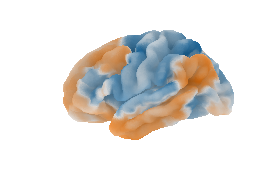

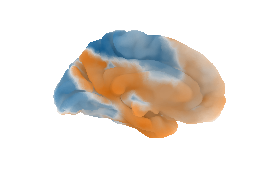

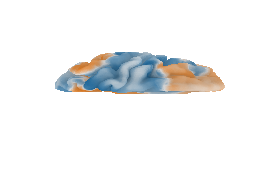

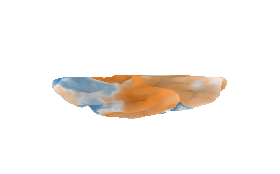

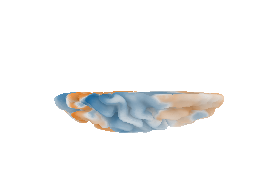

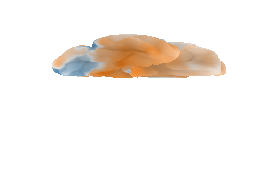

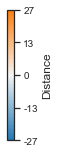

In [436]:
precuneus_div_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=src_dist['precuneus-div'])
tm = f'{path}/data/saved_data/surface_maps/hippocampus-tm.mat' 
precuneus_div_nii = vol_to_nii(precuneus_div_vol, 
                               name='precuneus-div', 
                               apply_xfm=True,
                               in_matrix_file=tm)

norm = matplotlib.colors.DivergingNorm(vmin=src_dist['precuneus-div'].min(),
                                       vcenter=0,
                                       vmax=src_dist['precuneus-div'].max())

# No threshold
plot_dist_surfmaps(precuneus_div_nii, 
                   name='precuneus-div', 
                   mesh='fsaverage', 
                   cmap=BuOr_mpl, 
                   norm=norm)

## Map MMD gradient to cortical surface

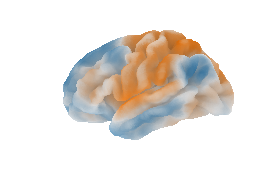

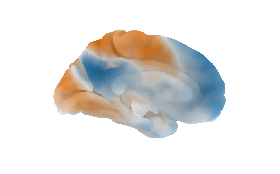

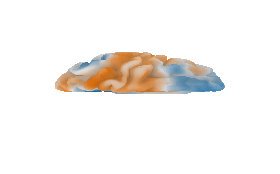

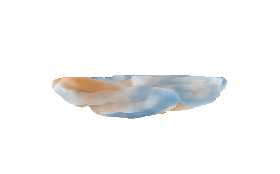

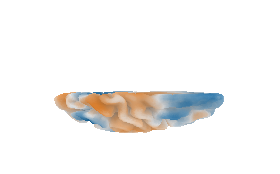

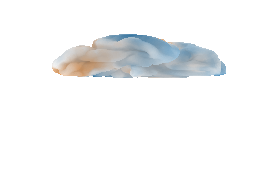

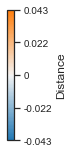

In [437]:
mmd_vol = roi_to_vol(h2514.roi_xyz.to_numpy(), values=h2514.qmax)

tm = f'{path}/data/saved_data/surface_maps/hippocampus-tm.mat'  # gives better registration
mmd_nii = vol_to_nii(mmd_vol, name='mmd', apply_xfm=True, in_matrix_file=tm)

# Set diverging colormap to center at 0
offset = matplotlib.colors.DivergingNorm(vmin=h2514.qmax.min(),
                                         vcenter=0,
                                         vmax=h2514.qmax.max())

plot_dist_surfmaps(mmd_nii, 
                   name='mmd', 
                   mesh='fsaverage', 
                   cmap=BuOr_mpl, 
                   norm=offset)

# F1000 plots

In [239]:
f1000_node_colors = create_node_colors(f1000.mod)

In [240]:
f1000_lobe_assignments = pd.read_csv(f'{path}/data/f1000-lobe-roi-assignments.csv')
f1000_lobe_assignments

,lobe,roi
0,Limbic Lobe,Amygdala
1,Parietal Lobe,Angular Gyrus
2,Brainstem,Brain-Stem
3,Sub-lobar,Caudate
4,Insula,Central Opercular Cortex
5,Limbic Lobe,Cingulate Gyrus anterior division
6,Limbic Lobe,Cingulate Gyrus posterior division
7,Parietal Lobe,Cuneal Cortex
8,Frontal Lobe,Frontal Orbital Cortex
9,Frontal Lobe,Frontal Pole


In [241]:
lut = dict(zip(f1000_lobe_assignments['roi'].to_list(), 
              f1000_lobe_assignments['lobe'].to_list()))

f1000.df['lobe'] = f1000.df['roi'].map(lut)

In [243]:
f1000_polar_medians = (f1000.df
                       .groupby('lobe')
                       .agg('median')
                       .sort_values('r')
                       .reset_index())

f1000_polar_medians

,lobe,x,y,theta,r,D,mod,mni_x,mni_y,mni_z
0,Brainstem,0.925888,2.837813,1.255418,2.985037,2.985037,0,-15.532000,-29.76600,-19.4290
1,Temporal Lobe,0.066086,-0.112030,-0.025977,3.203597,3.203597,1,31.949000,-15.67200,-13.6675
2,Sub-lobar,2.456216,-0.826720,-0.245681,3.520700,3.520700,0,0.376050,1.40135,3.8187
3,Parietal Lobe,-3.307432,-1.253879,-2.347652,4.481428,4.481428,1,-2.764450,-43.66100,41.3215
4,Frontal Lobe,3.519826,-1.836858,-0.483510,4.549075,4.549075,0,1.128125,28.01200,26.6540
5,Limbic Lobe,0.903465,0.597977,0.195435,4.595922,4.595922,0,0.339055,-5.57825,15.5174
6,Insula,-1.369346,-4.903657,-1.909419,5.021813,5.021813,1,-33.714000,5.40910,3.1193
7,Occipital Lobe,-4.499856,3.571153,2.479633,6.119439,6.119439,1,-6.947400,-73.57100,5.7500


/home/zdm/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/zdm/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


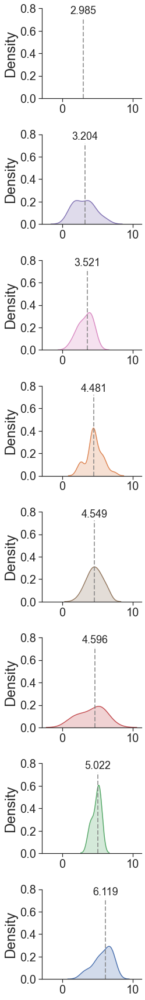

In [244]:
f1000_row_order = f1000_polar_medians['lobe']

g = sns.FacetGrid(f1000.df, row='lobe', hue='lobe', 
                  row_order=f1000_row_order)  # polar coordinates radius
g.map(sns.kdeplot, 'r', shade=True)

# Axis labels
g.set_titles('')
g.set_xlabels('')
g.set_ylabels('Density', fontsize=24)

# # Axis ticks
for i, ax in enumerate(g.axes.flatten()):
    ax.tick_params(labelbottom=True, labelleft=True, labelsize=20)  # show tick labels for all subplots
    ax.set_yticks([0.0, 0.2, 0.4, 0.6, 0.8])
    
    # Add median reference line and value
    ax.axvline(x=f1000_polar_medians['r'][i], 
               color='gray', 
               alpha=0.75, 
               linestyle='--',
               ymax=0.9, linewidth=2)
    
    ax.annotate(str(np.round(f1000_polar_medians['r'][i], 3)),
                xy=(f1000_polar_medians['r'][i], 0.75),
                ha='center', fontsize=18)
    
g.fig.subplots_adjust(hspace=0.4)  # increase space between rows
g.savefig(f'{path}/figures/f1000-distance-to-origin-by-lobe-kdeplot.svg', dpi=300)

In [247]:
# Facet glass brain by lobe

f1000_lut = dict(zip(f1000.df['lobe'].unique().tolist(), np.arange(len(f1000_row_order))))
f1000.df['lut'] = f1000.df['lobe'].map(f1000_lut)  # map LUT values to lobe name in dataframe

f1000_lobe_cmap = create_N_colors(len(f1000_row_order), sns.color_palette())

# Create lobe color array [red, green, blue, alpha]
f1000_lobe_colors = np.zeros([len(f1000.df['lobe']), 4])
f1000_lobe_colors[:, :3] = f1000_lobe_cmap[f1000.df['lut'], :]
f1000_lobe_colors[:, 3] = normalize(f1000.df['r'])

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:1766: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if node_color == 'auto':
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.6735102039614604. But, you have given threshold=1 
  threshold))
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.7021288564367139. But, you have given threshold=1 
  threshold))
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.8086116487941177. But, you have given threshold=1 
  threshold))
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.689236735

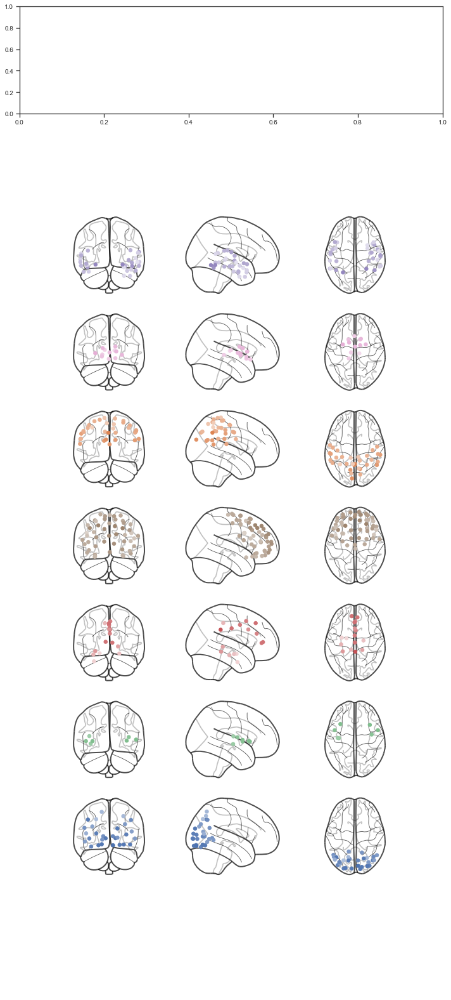

In [249]:
f, ax = plt.subplots(nrows=len(f1000_row_order), figsize=(10, 22))

for i, lobe in enumerate(f1000_row_order):
    # Generate lobe data
    if len(f1000.df.loc[f1000.df['lobe'] == lobe]) < 5:
        # Exlucde brainstem with only 1 ROI
        pass
    else:
        lobe_df = f1000.df.loc[f1000.df['lobe'] == lobe]
        lobe_xyz = lobe_df[['mni_x', 'mni_y', 'mni_z']].to_numpy()
        lobe_nw = f1000.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]
        color = f1000.df.loc[f1000.df['lobe'] == lobe, 'r'].to_numpy()
        lobe_cmap = sns.light_palette(sns_lobe_colors[f1000_lut[lobe]], 
                                      n_colors=10, as_cmap=True)

        # Build plot
        plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=30,
                       node_color=color, colorbar=False, edge_threshold=1,
                       node_kwargs={'cmap': lobe_cmap, 'vmin': 0, 
                                    'vmax': f1000.df['r'].max()}, 
                        axes=ax[i], annotate=False)
    
f.tight_layout()
f.savefig(f'{path}/figures/f1000-glass-brain-color-by-lobe-facet-distance-gradient-cmap.png',
          dpi=300,
          bbox_inches='tight')
f.savefig(f'{path}/figures/f1000-glass-brain-color-by-lobe-facet-distance-gradient-cmap.svg',
          dpi=300,
          bbox_inches='tight')

In [250]:
def f1000_polar_facet_plot(f, df, row_order, kind, lobe_colors=None, lut=None, cbar=False):
    """Plot facet plots in column to existing figure.
    
    Parameters
    ----------
    f : matplotlib figure
        Figure to plot to.
        
    df : pandas dataframe
        Dataframe with theta, radius, and lobe affiliation columns.
        
    row_order : tuple
        Tuple containing lobe affiliation strings to determine
        order for plotting the facets.
        
    kind : string
        Can be either 'distance' or 'mmd'. Determines the type of
        colormap used.
        
    lobe_colors : list, tuple, or numpy vector
        For 'distance' option, determines RGB value to be assigned 
        to each lobe for creating sequential colormap.
        
    lut : dict
        For 'distance' options, dictionary where keys are lobe 
        affiliation strings and values are integers used to index 
        lobe_colors.
    """
    if kind == 'mmd':
        # Offset to center diverging blue-orange colormap at zero
        offset = matplotlib.colors.DivergingNorm(vmin=f1000.qmax.min(),
                                                 vcenter=0,
                                                 vmax=f1000.qmax.max())

    for i, lobe in enumerate(row_order):
        lobe_df = df.loc[df['lobe'] == lobe]
        ax = f.add_subplot(len(row_order), 1, i+1, projection='polar')
        
        if kind == 'distance':
            lobe_cmap = sns.light_palette(lobe_colors[lut[lobe]], n_colors=10, as_cmap=True)
            ax.scatter(lobe_df['theta'], lobe_df['r'], 
                       c=lobe_df['r'], s=50, cmap=lobe_cmap, 
                       vmin=0, vmax=df['r'].max())
        elif kind == 'mmd':
            im = ax.scatter(lobe_df['theta'], lobe_df['r'], s=50, 
                            c=f1000.qmax[lobe_df.index], cmap=BuOr_mpl,
                            norm=offset,
                            vmin=f1000.qmax.min(), vmax=f1000.qmax.max())

        if cbar is True:
            cbar = f.colorbar(im, ax=ax, pad=0.2)
            cbar.ax.tick_params(labelsize=10)
            
            if kind == 'distance':
                cbar.ax.set_ylabel('Distance')
                
            elif kind == 'mmd':
                cbar.ax.set_ylabel('$q_{i}$')

        # Set labels
        ax.tick_params(axis='x', labelsize=24, pad=12)
        ax.tick_params(axis='y', labelsize=18)
        ax.set_title('') 
        #ax.set_ylim(0, 0.2)
        #ax.set_yticks([0, 0.1, 0.2])
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_ylim(0, 8)
        ax.set_yticks(np.arange(2, 10, step=2))
        #ax.set_yticklabels([10, 20, 30])

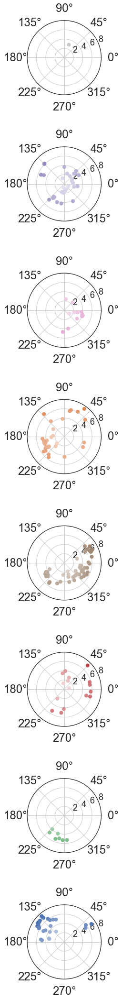

In [253]:
f = plt.figure(figsize=(set_size(double_col_width, subplots=(len(f1000_row_order), 1))))

f1000_polar_facet_plot(f, df=f1000.df, kind='distance', lobe_colors=f1000_lobe_cmap,
                 lut=f1000_lut, row_order=f1000_row_order)

f.subplots_adjust(hspace=0.7) # adjust spacing between rows
f.savefig(f'{path}/figures/f1000-isomap-distance-colormap.png', dpi=300, 
          bbox_inches='tight')
f.savefig(f'{path}/figures/f1000-isomap-distance-colormap.svg', dpi=300, 
          bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


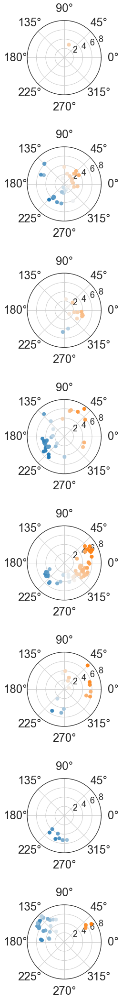

In [254]:
f = plt.figure(figsize=(set_size(double_col_width, subplots=(len(f1000_row_order), 1))))

f1000_polar_facet_plot(f, df=f1000.df, kind='mmd', lobe_colors=f1000_lobe_cmap,
                 lut=f1000_lobe_lut, row_order=f1000_row_order)

f.subplots_adjust(hspace=0.7) # adjust spacing between rows
f.savefig(f'{path}/figures/f1000-isomap-mmd-qvalue-gradient-colormap.png', dpi=300, 
          bbox_inches='tight')
f.savefig(f'{path}/figures/f1000-isomap-mmd-qvalue-gradient-colormap.svg', dpi=300, 
          bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:207: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  


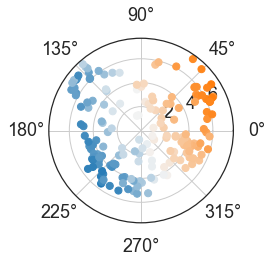

In [255]:
f, ax = plt.subplots(figsize=(set_size(onehalf_col_width)), 
                              subplot_kw={'projection': 'polar'})
ax.scatter(f1000.df['theta'], f1000.df['r'], s=50, 
                c=f1000.qmax, cmap=BuOr_mpl,
                norm=offset_div_cmap(f1000.qmax),
                vmin=f1000.qmax.min(), vmax=f1000.qmax.max())

ax.tick_params(labelsize=18, pad=10)
f.savefig(f'{path}/figures/f1000-isomap-mmd-all.png', dpi=300)
f.savefig(f'{path}/figures/f1000-isomap-mmd-all.svg', dpi=300)

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  """Entry point for launching an IPython kernel.


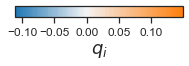

In [256]:
norm = matplotlib.colors.DivergingNorm(vmin=min(f1000.qmax), vcenter=0, vmax=max(f1000.qmax))

f, ax = plt.subplots(figsize=(3, 0.2))
cbar = matplotlib.colorbar.ColorbarBase(ax, cmap=BuOr_mpl, norm=norm, orientation='horizontal')
cbar.ax.tick_params(labelsize=12)
cbar.ax.set_xlabel('$q_{i}$', fontsize=18)

f.savefig(f'{path}/figures/f1000-mmd-gradient-colorbar.svg', bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:207: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:1766: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if node_color == 'auto':
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.6735102039614604. But, you have given threshold=1 
  threshold))
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:428: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  c=marker_color, **kwa

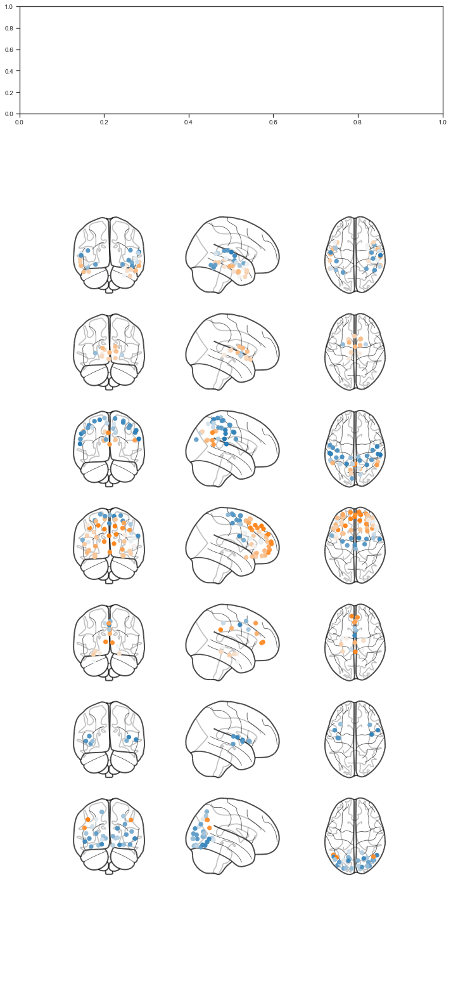

In [260]:
# Glass brain MMD by lobe
f, ax = plt.subplots(nrows=len(f1000_row_order), figsize=(10, 22))

for i, lobe in enumerate(f1000_row_order):
    
    if len(f1000.df.loc[f1000.df['lobe'] == lobe]) < 5:
    # Exlucde brainstem with only 1 ROI
        pass
    else:
        # Generate lobe data
        lobe_df = f1000.df.loc[f1000.df['lobe'] == lobe]
        lobe_xyz = lobe_df[['mni_x', 'mni_y', 'mni_z']].to_numpy()
        lobe_nw = f1000.avg_nw[np.ix_(lobe_df.index, lobe_df.index)]

        # Build plot
        plot_connectome(lobe_nw, node_coords=lobe_xyz, node_size=40,
                        node_color=f1000.qmax[lobe_df.index], colorbar=False, edge_threshold=1,
                        node_kwargs={'cmap': BuOr_mpl,
                                     'norm': offset_div_cmap(f1000.qmax),
                                     'vmin': min(f1000.qmax),
                                     'vmax': max(f1000.qmax)}, 
                        axes=ax[i], annotate=False)
    
f.tight_layout()
f.savefig(f'{path}/figures/f1000-glass-brain-color-by-mmd-facet-qvalue-gradient.png',
          dpi=300,
          bbox_inches='tight')
f.savefig(f'{path}/figures/f1000-glass-brain-color-by-mmd-facet-qvalue-gradient.svg',
          dpi=300,
          bbox_inches='tight')

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:207: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.


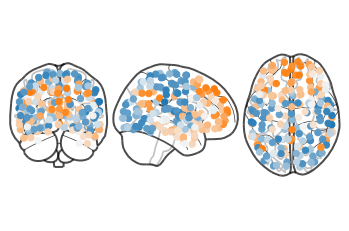

In [261]:
# MMD Glass brain with all regions together
# Center blue-orange values at zero
f, ax = plt.subplots()
    
# Build plot
plot_connectome(f1000.avg_nw, node_coords=f1000.roi_xyz.to_numpy(), node_size=40,
                node_color=f1000.qmax, colorbar=False, edge_threshold=1,
                node_kwargs={'cmap': BuOr_mpl,
                             'norm': offset_div_cmap(f1000.qmax),
                             'vmin': min(f1000.qmax),
                             'vmax': max(f1000.qmax)}, 
                axes=ax, annotate=False)

f.savefig(f'{path}/figures/f1000-glass-brain-color-by-mmd-qvalue-gradient.png', dpi=300,
         bbox_inches='tight')
f.savefig(f'{path}/figures/f1000-glass-brain-color-by-mmd-qvalue-gradient.svg', dpi=300,
         bbox_inches='tight')

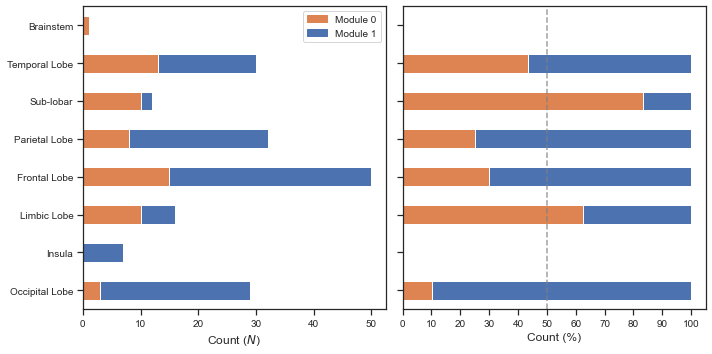

In [262]:
# Counts by lobe
f_counts = ((f1000.df.copy()
          .groupby(['lobe', 'mod'], as_index=False)
          .agg(['count']))['roi']
          .reset_index())

f_counts['mod'] = counts['mod'].astype('category')
f_counts['lobe'] = pd.Categorical(f_counts['lobe'], 
                                categories=reversed(list(f1000_row_order)), 
                                ordered=True)

fcounts2 = f_counts.set_index('lobe').pivot(columns='mod', values='count')
fcounts2

# Percent counts
fmod0 = fcounts2.iloc[:, 0].reset_index(drop=True)
fmod1 = fcounts2.iloc[:, 1].reset_index(drop=True)

fpercs = pd.DataFrame({'lobe': pd.Series(reversed(f1000_row_order)),
                               'mod0': fmod0, 
                               'mod1': fmod1})

fpercs['per0'] = (fpercs['mod0'] / (fpercs['mod0'] + fpercs['mod1'])) * 100
fpercs['per1'] = 100 - fpercs['per0']

fpercs = fpercs[['lobe', 'per0', 'per1']].set_index('lobe')
fpercs

# Build plot
colors = np.vstack([sns_orange, sns_blue])

f, ax = plt.subplots(ncols=2, figsize=(10, 6))
fcounts2.plot(kind='barh', stacked=True, ax=ax[0], color=colors)
fpercs.plot(kind='barh', stacked=True, ax=ax[1], color=colors)

# Plot aesthetics
ax[0].set_aspect(square_ax(ax[0]))
ax[0].get_legend().remove()
ax[0].set_ylabel('')
ax[0].set_xlabel('Count ($N$)')

ax[1].axvline(x=50, color='gray', linestyle='--', alpha=0.75)
ax[1].set_aspect(square_ax(ax[1]))
ax[1].get_legend().remove()
ax[1].set_xticks(np.arange(101, step=10))
ax[1].set_xticklabels(np.arange(101, step=10))
ax[1].set_yticklabels([])
ax[1].set_ylabel('')
ax[1].set_xlabel('Count (%)')

# Custom legend
blue_bar = matplotlib.patches.Patch(color=colors[0], label='Module 0')
orange_bar = matplotlib.patches.Patch(color=colors[1], label='Module 1')

ax[0].legend(handles=[blue_bar, orange_bar], loc='upper right')

f.tight_layout()
# f.savefig(f'{path}/figures/f1000-count-and-percentages-by-module.png', dpi=300)
# f.savefig(f'{path}/figures/f1000-count-and-percentages-by-module.svg', dpi=300)

In [342]:
lobe_totals = f1000.df[['lobe', 'roi']].groupby('lobe').size()
lobe_totals.name = 'total'
lobe_totals

lobe
Brainstem          1
Frontal Lobe      50
Insula             7
Limbic Lobe       16
Occipital Lobe    29
Parietal Lobe     32
Sub-lobar         12
Temporal Lobe     30
Name: total, dtype: int64

In [356]:
mod_lobe_counts = (f1000.df.loc[f1000.df['lobe'] != 'Brainstem', ['mod', 'lobe', 'roi']]
                   .groupby(['mod', 'lobe'])).size()
mod_lobe_counts.name = 'count'
mod_lobe_counts = mod_lobe_counts.reset_index('mod')
mod_lobe_counts = pd.merge(mod_lobe_counts, lobe_totals, how='left', on='lobe').reset_index()
mod_lobe_counts['perc'] = (mod_lobe_counts['count'] / mod_lobe_counts['total']) * 100
mod_lobe_counts

,lobe,mod,count,total,perc
0,Frontal Lobe,0,35,50,70.000000
1,Limbic Lobe,0,10,16,62.500000
2,Occipital Lobe,0,3,29,10.344828
3,Parietal Lobe,0,8,32,25.000000
4,Sub-lobar,0,10,12,83.333333
5,Temporal Lobe,0,13,30,43.333333
6,Frontal Lobe,1,15,50,30.000000
7,Insula,1,7,7,100.000000
8,Limbic Lobe,1,6,16,37.500000
9,Occipital Lobe,1,26,29,89.655172


In [359]:
mod_lobe_counts.pivot_table('perc', index='lobe', columns='mod')

mod,0,1
lobe,,
Frontal Lobe,70.000000,30.000000
Insula,NaN,100.000000
Limbic Lobe,62.500000,37.500000
Occipital Lobe,10.344828,89.655172
Parietal Lobe,25.000000,75.000000
Sub-lobar,83.333333,16.666667
Temporal Lobe,43.333333,56.666667


/home/zdm/anaconda3/lib/python3.7/site-packages/pandas/plotting/_core.py:185: UserWarning: 'colors' is being deprecated. Please use 'color'instead of 'colors'
  warnings.warn(("'colors' is being deprecated. Please use 'color'"


<AxesSubplot:ylabel='lobe'>

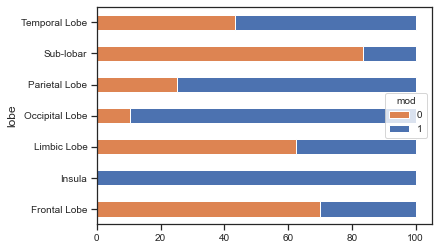

In [367]:
(mod_lobe_counts
 .pivot_table('perc', index='lobe', columns='mod')
 .plot(kind='barh', stacked=True, colors=np.vstack([sns_orange, sns_blue])))

In [263]:
f0 = f1000.df.loc[(f1000.df['lobe'] == 'Frontal Lobe') & (f1000.df['mod'] == 0)]

In [264]:
f1 = f1000.df.loc[(f1000.df['lobe'] == 'Frontal Lobe') & (f1000.df['mod'] == 1)]

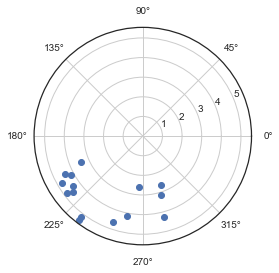

In [268]:
f, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.scatter(f1['theta'], f1['r'])

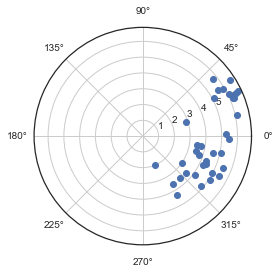

In [269]:
f, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.scatter(f0['theta'], f0['r'])

In [265]:
fpercs  # 0 = orange; 1 = blue

,per0,per1
lobe,,
Occipital Lobe,10.344828,89.655172
Insula,NaN,NaN
Limbic Lobe,62.500000,37.500000
Frontal Lobe,30.000000,70.000000
Parietal Lobe,25.000000,75.000000
Sub-lobar,83.333333,16.666667
Temporal Lobe,43.333333,56.666667
Brainstem,NaN,NaN


# Plotting Q and MMD modularity glass brain and embedding

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:207: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:31: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:64: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


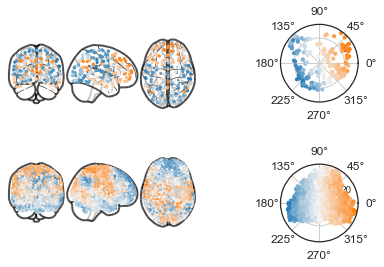

In [267]:
# Isomap
w, h = set_size(double_col_width, subplots=(2, 2))
f = plt.figure(figsize=(w, 4))

"""F1000"""
# Plot aesthetics
edge_threshold = 1  # turn off edges
ax00 = f.add_subplot(221)
plot_connectome(f1000.avg_nw, node_coords=f1000.roi_xyz, node_size=5,
                node_color=f1000.qmax, colorbar=False, edge_threshold=1,
                annotate=False,
                node_kwargs={'cmap': BuOr_mpl,
                             'norm': offset_div_cmap(f1000.qmax),
                             'vmin': min(f1000.qmax),
                             'vmax': max(f1000.qmax),
                             'rasterized': True}, 
                axes=ax00)

ax01 = f.add_subplot(222, projection='polar')
ax01.scatter(f1000.df['theta'], f1000.df['r'], s=10, 
                c=f1000.qmax, cmap=BuOr_mpl,
                norm=offset_div_cmap(f1000.qmax),
                vmin=f1000.qmax.min(), vmax=f1000.qmax.max())

ax01.tick_params(axis='x', labelsize=12, pad=0)
ax01.tick_params(axis='y', labelsize=10)
# ax01.set_ylim(0, 0.2)
# ax01.set_yticks([0, 0.1, 0.2])

"""2514"""
# Plot aesthetics
edge_threshold = 1  # turn off edges

ax10 = f.add_subplot(223)

plot_connectome(h2514.avg_nw, node_coords=h2514.roi_xyz, node_size=2,
                node_color=h2514.qmax, colorbar=False, edge_threshold=1,
                annotate=False,
                node_kwargs={'cmap': BuOr_mpl,
                             'norm': offset_div_cmap(h2514.qmax),
                             'vmin': min(h2514.qmax),
                             'vmax': max(h2514.qmax),
                             'rasterized': True}, 
                axes=ax10)

ax11 = f.add_subplot(224, projection='polar')

ax11.scatter(h2514.df['theta'], h2514.df['r'], s=10,
            c=h2514.qmax, cmap=BuOr_mpl,
            norm=offset_div_cmap(h2514.qmax), vmin=h2514.qmax.min(), 
             vmax=h2514.qmax.max())

ax11.tick_params(axis='x', labelsize=12, pad=0)
ax11.tick_params(axis='y', labelsize=10)
# ax11.set_ylim(0, 0.08)
# ax11.set_yticks([0, 0.04, 0.08])



f.subplots_adjust(wspace=0, hspace=0.8)
f.savefig(f'{path}/figures/glass-brain-and-isomap-both.svg', 
          dpi=300, bbox_inches='tight')
f.savefig(f'{path}/figures/glass-brain-and-isomap-both.png', 
          dpi=300, bbox_inches='tight')

## Silhouette score across different clusterings in the embedding space

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  


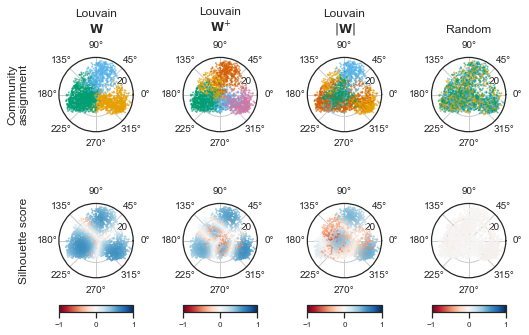

In [383]:
# Plotter functions
def sil_offset(silscores):
    """Center silhouette score cmap at 0."""
    offset = matplotlib.colors.DivergingNorm(vmin=-1,
                                             vcenter=0,
                                             vmax=1)
    
    return offset


def plot_mod(df, mod, ax, s=2):
    """Plot modularity embedding plot."""
    return ax.scatter(df['theta'], df['r'], s=s,
                      c=np.hstack((create_node_colors(mod - 1, 
                                                      cmap=cb_palette),
                                   np.tile(0.5, [len(mod), 1]))))
    
    
def plot_silscores(df, silscores, ax, s=2):
    """Plot embedding with silhouette scores."""
    im = ax.scatter(df['theta'], df['r'], s=s,
                      c=silscores, alpha=0.8, cmap='RdBu',
                      norm=sil_offset(silscores))

    cbar = f.colorbar(im, 
                      ax=ax, 
                      orientation='horizontal', 
                      pad=0.2, 
                      ticks=[-1, 0, 1], 
                      aspect=10)
    cbar.ax.tick_params(labelsize=8)


# def add_cbar(f, im, ax):
#     cbar = f.colorbar(im, ax=ax, orientation='horizontal', pad=0.2, ticks=[-1, 0, 1])
#     cbar.ax.tick_params(labelsize=8)
    
    return cbar
    

# Setup figure
w, h = set_size(double_col_width)
f, ax = plt.subplots(ncols=4, nrows=2,
                     subplot_kw={'projection': 'polar'},
                     figsize=(w, 5))

s = 1
labelsize = 10

# Build plot
# ----------

# Louvain | W
#plot_mod(polar_df, h2514_mod_q, ax[0, 0], s=s)
h2514_mod_q, _ = bct.community_louvain(h2514.avg_nw, B='negative_sym')
plot_mod(h2514.df, h2514_mod_q, ax[0, 0], s=s)
ax[0, 0].set_title('Louvain\n$\\mathbf{W}$', pad=25)
ax[0, 0].set_ylabel('Community\nassignment', labelpad=30)

#h_silscores = silhouette_samples(edist(h2514_theta_iso[:, :2]), h2514_mod_q)
h_silscores = silhouette_samples(edist(h2514.isomap), h2514_mod_q)
#plot_silscores(polar_df, h_silscores, ax[1, 0], s=s)
plot_silscores(h2514.df, h_silscores, ax[1, 0], s=s)
ax[1, 0].set_ylabel('Silhouette score', labelpad=30)


# Louvain | W+
h_thresh = h2514.avg_nw.copy()
h_thresh[h_thresh < 0] = 0
h_modq_thresh, _ = bct.community_louvain(h_thresh)
#hthresh_silscores = silhouette_samples(edist(h2514_theta_iso[:, :2]), h_modq_thresh)
hthresh_silscores = silhouette_samples(edist(h2514.isomap), h_modq_thresh)

#plot_mod(polar_df, h_modq_thresh, ax[0, 1], s=s)
plot_mod(h2514.df, h_modq_thresh, ax[0, 1], s=s)
ax[0, 1].set_title('Louvain\n$\\mathbf{W}^{+}$', pad=25)

#plot_silscores(polar_df, hthresh_silscores, ax[1, 1], s=s)
plot_silscores(h2514.df, hthresh_silscores, ax[1, 1], s=s)

# Louvain | |W|
habs = np.abs(h2514.avg_nw.copy())
habs_mod, _ = bct.community_louvain(habs)

#plot_mod(polar_df, habs_mod, ax[0, 2], s=s)
plot_mod(h2514.df, habs_mod, ax[0, 2], s=s)
ax[0, 2].set_title('Louvain\n$|\\mathbf{W}|$', pad=25)

#habs_silscores = silhouette_samples(edist(h2514_theta_iso[:, :2]), habs_mod)
habs_silscores = silhouette_samples(edist(h2514.isomap), habs_mod)
#plot_silscores(polar_df, habs_silscores, ax[1, 2], s=s)
plot_silscores(h2514.df, habs_silscores, ax[1, 2], s=s)

# Random labels
h_perm_labels = np.random.permutation(h2514_mod_q)
#h_perm_silscores = silhouette_samples(edist(h2514_theta_iso[:, :2]), h_perm_labels)
h_perm_silscores = silhouette_samples(edist(h2514.isomap), h_perm_labels)
ax[0, 3].set_title('Random', pad=25)

#plot_mod(polar_df, h_perm_labels, ax[0, 3], s=s)
#plot_silscores(polar_df, h_perm_silscores, ax[1, 3], s=s)

plot_mod(h2514.df, h_perm_labels, ax[0, 3], s=s)
plot_silscores(h2514.df, h_perm_silscores, ax[1, 3], s=s)



# Set ticklabel size
plt_idx = np.unravel_index(np.arange(8), shape=(2, 4))
for i in range(len(plt_idx[0])):
    ax[plt_idx[0][i], plt_idx[1][i]].tick_params(axis='both', labelsize=labelsize)
    ax[plt_idx[0][i], plt_idx[1][i]].tick_params(axis='x', pad=-1)

f.tight_layout()
f.savefig(f'{path}/figures/2514-silhouette-scores.png', dpi=600, transparent=True)
f.savefig(f'{path}/figures/2514-silhouette-scores.svg', dpi=600, transparent=True)

/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  
/home/zdm/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: 
The DivergingNorm class was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use TwoSlopeNorm instead.
  


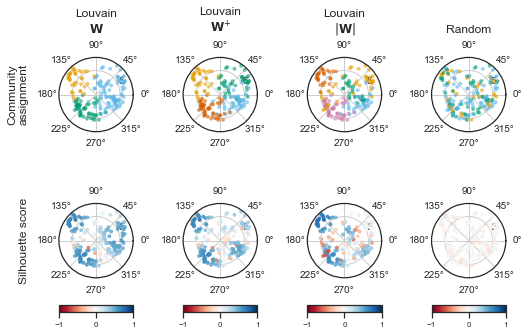

In [387]:
# Setup figure
w, h = set_size(double_col_width)
f, ax = plt.subplots(ncols=4, nrows=2,
                     subplot_kw={'projection': 'polar'},
                     figsize=(w, 5))

s = 8
labelsize = 10

# Build plot
# ----------

# Louvain | W
f1000_mod_q, _ = bct.community_louvain(f1000.avg_nw, B='negative_sym')
plot_mod(f1000.df, f1000_mod_q, ax[0, 0], s=s)
# plot_mod(sil_df, f1000_mod_q, ax[0, 0], s=s)
ax[0, 0].set_title('Louvain\n$\\mathbf{W}$', pad=25)
ax[0, 0].set_ylabel('Community\nassignment', labelpad=30)

#f_silscores = silhouette_samples(edist(f1000_theta_iso[:, :2]), f1000_mod_q)
f_silscores = silhouette_samples(edist(f1000.isomap), f1000_mod_q)
#plot_silscores(sil_df, f_silscores, ax[1, 0], s=s)
plot_silscores(f1000.df, f_silscores, ax[1, 0], s=s)
ax[1, 0].set_ylabel('Silhouette score', labelpad=30)


# Louvain | W+
f_thresh = f1000.avg_nw.copy()
f_thresh[f_thresh < 0] = 0
f_modq_thresh, _ = bct.community_louvain(f_thresh)
#fthresh_silscores = silhouette_samples(edist(f1000_theta_iso[:, :2]), f_modq_thresh)
fthresh_silscores = silhouette_samples(edist(f1000.isomap), f_modq_thresh)

#plot_mod(sil_df, f_modq_thresh, ax[0, 1], s=s)
plot_mod(f1000.df, f_modq_thresh, ax[0, 1], s=s)
ax[0, 1].set_title('Louvain\n$\\mathbf{W}^{+}$', pad=25)

#plot_silscores(sil_df, fthresh_silscores, ax[1, 1], s=s)
plot_silscores(f1000.df, fthresh_silscores, ax[1, 1], s=s)

# Louvain | |W|
f_abs = np.abs(f1000.avg_nw.copy())
f_abs_mod, _ = bct.community_louvain(f_abs)

#plot_mod(sil_df, f_abs_mod, ax[0, 2], s=s)
plot_mod(f1000.df, f_abs_mod, ax[0, 2], s=s)
ax[0, 2].set_title('Louvain\n$|\\mathbf{W}|$', pad=25)

#f_abs_silscores = silhouette_samples(edist(f1000_theta_iso[:, :2]), f_abs_mod)
f_abs_silscores = silhouette_samples(edist(f1000.isomap), f_abs_mod)
#plot_silscores(sil_df, f_abs_silscores, ax[1, 2], s=s)
plot_silscores(f1000.df, f_abs_silscores, ax[1, 2], s=s)

# Random labels
f_perm_labels = np.random.permutation(f1000_mod_q)
#f_perm_silscores = silhouette_samples(edist(f1000_theta_iso[:, :2]), f_perm_labels)
f_perm_silscores = silhouette_samples(edist(f1000.isomap), f_perm_labels)
ax[0, 3].set_title('Random', pad=25)

# plot_mod(sil_df, f_perm_labels, ax[0, 3], s=s)
# plot_silscores(sil_df, f_perm_silscores, ax[1, 3], s=s)

plot_mod(f1000.df, f_perm_labels, ax[0, 3], s=s)
plot_silscores(f1000.df, f_perm_silscores, ax[1, 3], s=s)



# Set ticklabel size
plt_idx = np.unravel_index(np.arange(8), shape=(2, 4))
for i in range(len(plt_idx[0])):
    ax[plt_idx[0][i], plt_idx[1][i]].tick_params(axis='both', labelsize=labelsize)
    ax[plt_idx[0][i], plt_idx[1][i]].tick_params(axis='x', pad=-1)

f.tight_layout()
f.savefig(f'{path}/figures/f1000-silhouette-scores.png', dpi=600, transparent=True)
f.savefig(f'{path}/figures/f1000-silhouette-scores.svg', dpi=600, transparent=True)

In [557]:
# Silhouette scores across multiple Louvain runs
n_iter = 100
h_W_sil = np.zeros(n_iter)
h_Wplus_sil = np.zeros_like(h_W_sil)
h_Wabs_sil = np.zeros_like(h_W_sil)
h_rand_sil = np.zeros_like(h_W_sil)

f_W_sil = np.zeros(n_iter)
f_Wplus_sil = np.zeros_like(f_W_sil)
f_Wabs_sil = np.zeros_like(f_W_sil)
f_rand_sil = np.zeros_like(f_W_sil)

for i in range(n_iter):
    # W
    f_W_mod, _ = bct.community_louvain(f1000.avg_nw, B='negative_sym')
    h_W_mod, _ = bct.community_louvain(h2514.avg_nw, B='negative_sym')

    f_W_sil[i] = silhouette_score(edist(f1000.isomap), f_W_mod)
    h_W_sil[i] = silhouette_score(edist(h2514.isomap), h_W_mod)
    
    # W+
    f_Wplus_mod, _ = bct.community_louvain(f_thresh)
    h_Wplus_mod, _ = bct.community_louvain(h_thresh)
    
    f_Wplus_sil[i] = silhouette_score(edist(f1000.isomap), f_Wplus_mod)
    h_Wplus_sil[i] = silhouette_score(edist(h2514.isomap), h_Wplus_mod)
    
    
    # |W|
    f_Wabs_mod, _ = bct.community_louvain(f_abs)
    h_Wabs_mod, _ = bct.community_louvain(habs)
    
    f_Wabs_sil[i] = silhouette_score(edist(f1000.isomap), f_Wabs_mod)
    h_Wabs_sil[i] = silhouette_score(edist(h2514.isomap), h_Wabs_mod)
    
    
    # Random
    f_rand_sil[i] = silhouette_score(edist(f1000.isomap), 
                                     np.random.permutation(f_W_mod))
    h_rand_sil[i] = silhouette_score(edist(h2514.isomap), 
                                     np.random.permutation(h_W_mod))

/home/zdm/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:715: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


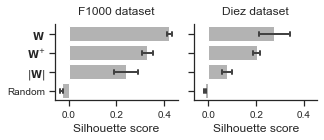

In [759]:
sil_iter_df = (pd.DataFrame({'F1000 $\\mathbf{W}$': f_W_sil, 
                            'F1000 $\\mathbf{W}^{+}$': f_Wplus_sil,
                            'F1000 $|\\mathbf{W}|$': f_Wabs_sil,
                            'F1000 Random': f_rand_sil,
                            'Diez $\\mathbf{W}$': h_W_sil,
                            'Diez $\\mathbf{W}^{+}$': h_Wplus_sil,
                            'Diez $|\\mathbf{W}|$': h_Wabs_sil,
                            'Diez Random': h_rand_sil})
               .melt(var_name='method', value_name='Silhouette score'))

tmp = sil_iter_df['method'].str.split(' ', expand=True)
sil_iter_df['dataset'] = tmp[0]
sil_iter_df['method'] = tmp[1]

g = sns.FacetGrid(data=sil_iter_df, 
                  col='dataset', 
                  height=2, 
                  aspect=1.2,
                  col_order=['F1000', 'Diez'])

g.map(sns.barplot, 
      'Silhouette score', 
      'method', 
      color=[0.7, 0.7, 0.7],             
      ci='sd', 
      errwidth=2,
      capsize=0.2)

g.set_axis_labels('Silhouette score', '')

g.fig.axes[0].set_title('F1000 dataset', pad=10)
g.fig.axes[1].set_title('Diez dataset', pad=10)
g.savefig(f'{path}/figures/silhouette-score-iter-comparison.pdf', dpi=300, bbox_inches='tight')
g.savefig(f'{path}/figures/silhouette-score-iter-comparison.svg', dpi=300, bbox_inches='tight')

In [562]:
# Statistics
f_results = smf.ols('Q("Silhouette score") ~ C(method)', 
                  data=sil_iter_df.loc[sil_iter_df['dataset'] == 'F1000']).fit()

sm.stats.anova_lm(f_results)

,df,sum_sq,mean_sq,F,PR(>F)
C(method),3.0,11.355927,3.785309,4660.61327,2.069574e-308
Residual,396.0,0.321628,0.000812,NaN,NaN


In [563]:
h_results = smf.ols('Q("Silhouette score") ~ C(method)', 
                  data=sil_iter_df.loc[sil_iter_df['dataset'] == 'Diez']).fit()

sm.stats.anova_lm(h_results)

,df,sum_sq,mean_sq,F,PR(>F)
C(method),3.0,5.000867,1.666956,1313.85702,2.237429e-205
Residual,396.0,0.502425,0.001269,NaN,NaN


In [564]:
# post hoc
f1000_sil = sil_iter_df.loc[sil_iter_df['dataset'] == 'F1000']
h2514_sil = sil_iter_df.loc[sil_iter_df['dataset'] == 'Diez']

f_posthoc = sm.stats.multicomp.MultiComparison(data=f1000_sil['Silhouette score'],
                                               groups=f1000_sil['method'])

print(f_posthoc.tukeyhsd())

          Multiple Comparison of Means - Tukey HSD, FWER=0.05          
     group1           group2      meandiff p-adj  lower   upper  reject
-----------------------------------------------------------------------
    $\mathbf{W}$ $\mathbf{W}^{+}$  -0.0919 0.001 -0.1023 -0.0815   True
    $\mathbf{W}$   $|\mathbf{W}|$  -0.1803 0.001 -0.1907 -0.1699   True
    $\mathbf{W}$           Random  -0.4509 0.001 -0.4613 -0.4405   True
$\mathbf{W}^{+}$   $|\mathbf{W}|$  -0.0884 0.001 -0.0988  -0.078   True
$\mathbf{W}^{+}$           Random  -0.3591 0.001 -0.3695 -0.3487   True
  $|\mathbf{W}|$           Random  -0.2706 0.001  -0.281 -0.2602   True
-----------------------------------------------------------------------


In [565]:
h_posthoc = sm.stats.multicomp.MultiComparison(data=h2514_sil['Silhouette score'],
                                               groups=h2514_sil['method'])

print(h_posthoc.tukeyhsd())

          Multiple Comparison of Means - Tukey HSD, FWER=0.05          
     group1           group2      meandiff p-adj  lower   upper  reject
-----------------------------------------------------------------------
    $\mathbf{W}$ $\mathbf{W}^{+}$  -0.0732 0.001 -0.0862 -0.0602   True
    $\mathbf{W}$   $|\mathbf{W}|$  -0.1982 0.001 -0.2112 -0.1852   True
    $\mathbf{W}$           Random  -0.2902 0.001 -0.3032 -0.2772   True
$\mathbf{W}^{+}$   $|\mathbf{W}|$   -0.125 0.001  -0.138  -0.112   True
$\mathbf{W}^{+}$           Random   -0.217 0.001   -0.23  -0.204   True
  $|\mathbf{W}|$           Random   -0.092 0.001  -0.105  -0.079   True
-----------------------------------------------------------------------


# Neurosynth

In [649]:
def nsynth_plot(nsynth_term, embedding=h2514):
    """Wrapper for exploratory neurosynth plots."""
    nsynth = r2v.Neurosynth(
        f'{nsynth_dir}/{nsynth_term}/{nsynth_term}_association-test_z_FDR_0.01.nii.gz',
        embedding)
    
    # Embedding
    f, ax = plt.subplots(subplot_kw={'projection': 'polar'}, 
                         figsize=set_size(single_col_width))
    
    ax.set_title(nsynth_term, pad=30)
    
    # Glass brain
    nsynth.plot_nsynth_vals(embedding.df, ax=ax, s=5, cmap='magma')
    g, ax = plt.subplots()
    nsynth.plot_nsynth_brain(node_size=15, ax=ax)
    
    
def nsynth(nsynth_term, embedding=h2514):
    """Wrapper to make neurosynth object from specified path."""
    nsynth_obj = r2v.Neurosynth(
        f'{nsynth_dir}/{nsynth_term}/{nsynth_term}_association-test_z_FDR_0.01.nii.gz',
        embedding)
    
    return nsynth_obj
    
    
nsynth_dir = f'{path}/data/neurosynth'

In [660]:
dmn = nsynth('default mode')
reward = nsynth('reward')
motor_control = nsynth('motor control')
auditory = nsynth('auditory')
speech = nsynth('speech')
dec_making = nsynth('decision making')
visual = nsynth('visual')
anxiety = nsynth('anxiety')

maps = [dmn, reward, motor_control, auditory,
        speech, dec_making, visual, anxiety]

titles = ['Default mode network',
          'Reward',
          'Motor control',
          'Auditory',
          'Speech',
          'Decision making',
          'Visual',
          'Anxiety']

In [711]:
def nsynth_facet_plot(f, maps, cbar=False, s=10):
    """Create neurosynth facet plots in column to existing figure."""
    for i, nsynth_map in enumerate(maps):
        ax = f.add_subplot(len(row_order), 1, i+1, projection='polar')
        im = nsynth_map.plot_nsynth_vals(h2514.df, ax=ax, s=s, cmap='magma')
        
            
        if cbar:
            norm = matplotlib.colors.Normalize(vmin=0, 
                                               vmax=nsynth_map.nsynth_vals.max())
            sm = plt.cm.ScalarMappable(cmap='magma', norm=norm)
            sm.set_array([])
            
            cb = f.colorbar(sm, ax=ax, pad=0.2, aspect=8)
            cb.ax.tick_params(labelsize=20)
            cb.ax.set_ylabel('$z$-score', fontsize=26)
                
        # Set labels
        ax.tick_params(axis='x', labelsize=26, pad=15)
        ax.tick_params(axis='y', labelsize=20) 
        ax.set_title(f'{titles[i]}', fontsize=28, pad=50)
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_ylim(0, 40)
        ax.set_yticks([20, 40])

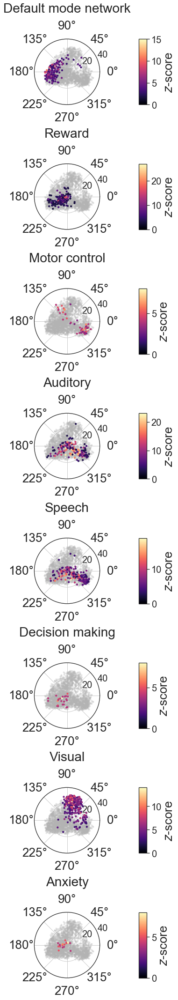

In [713]:
f = plt.figure(figsize=(set_size(double_col_width, subplots=(len(maps), 1))))

nsynth_facet_plot(f, maps, cbar=True)

f.subplots_adjust(hspace=0.9)
f.savefig(f'{path}/figures/neurosynth/neurosynth-isomap-panel.svg')

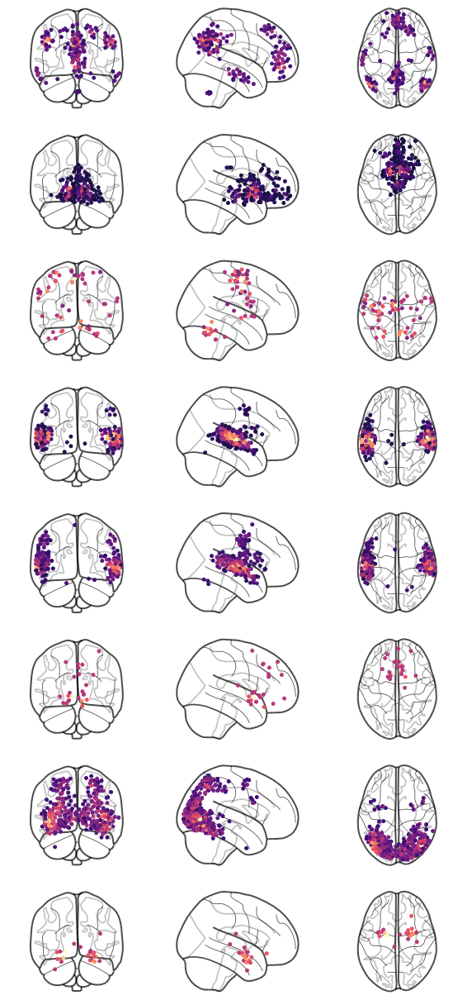

In [716]:
f, ax = plt.subplots(nrows=len(maps), figsize=(10, 22))


for i, m in enumerate(maps):
    m.plot_nsynth_brain(node_size=15, ax=ax[i])
    
f.savefig(f'{path}/figures/neurosynth/neurosynth-glass-brain-panel.svg', dpi=600)

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:1766: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if node_color == 'auto':
/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.844263144324299. But, you have given threshold=1 
  threshold))


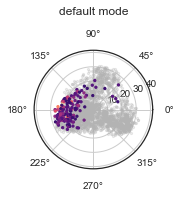

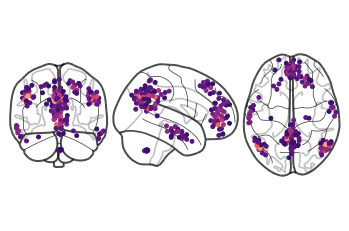

In [653]:
nsynth_plot('default mode')

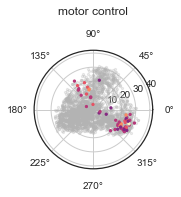

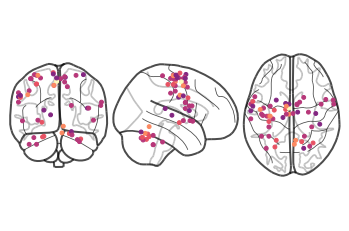

In [805]:
nsynth_plot('motor control')

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.7874939611039561. But, you have given threshold=1 
  threshold))


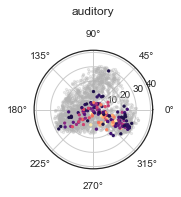

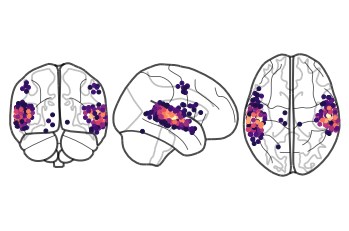

In [807]:
nsynth_plot('auditory')

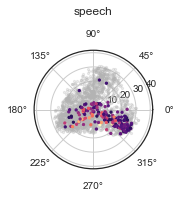

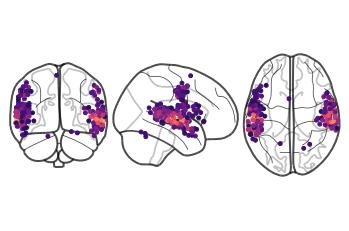

In [809]:
nsynth_plot('speech')

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.6272405443654071. But, you have given threshold=1 
  threshold))


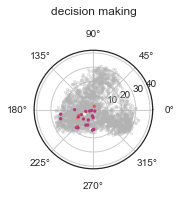

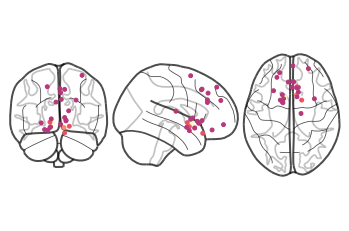

In [810]:
nsynth_plot('decision making')

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.5787245797345574. But, you have given threshold=1 
  threshold))


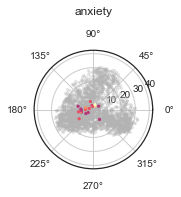

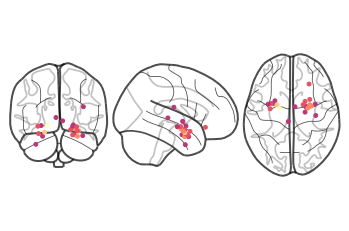

In [811]:
nsynth_plot('anxiety')

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.901382345271923. But, you have given threshold=1 
  threshold))


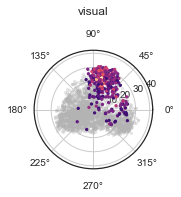

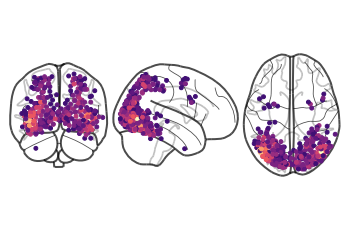

In [814]:
nsynth_plot('visual')

/home/zdm/anaconda3/lib/python3.7/site-packages/nilearn/_utils/param_validation.py:71: UserWarning: The given float value must not exceed 0.7361531925657744. But, you have given threshold=1 
  threshold))


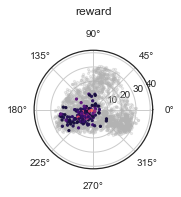

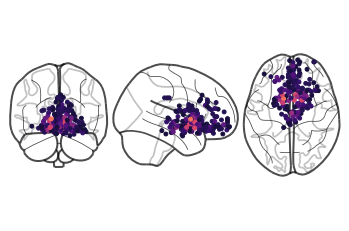

In [818]:
nsynth_plot('reward')

# Range of isomap nearest neighbors

In [728]:
knn = np.arange(20, 101, step=20)

In [729]:
h2514_isomap_k = []
h2514_isomap_recon_err = []
for i, k in enumerate(knn):
    h2514_iso_model = Isomap(n_neighbors=k, n_components=2, path_method='D')
    h2514_isomap_ki = h2514_iso_model.fit_transform(h2514.theta)
    h2514_isomap_k.append(h2514_isomap_ki)
    h2514_isomap_recon_err.append(h2514_iso_model.reconstruction_error())
    

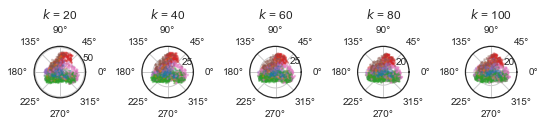

In [758]:
sns_lobe_colors = sns.color_palette(n_colors=len(row_order))
lut = dict(zip(h2514.df['lobe'].unique().tolist(), np.arange(len(row_order))))


w, h = set_size(double_col_width, subplots=(2, 5))
f, ax = plt.subplots(figsize=(w, 4), 
                     subplot_kw={'projection': 'polar'}, 
                     ncols=5, 
                     nrows=1, constrained_layout=True)

#plt_idx = np.unravel_index(np.arange(len(knn)), shape=(2, 5))

for i, iso_xyz in enumerate(h2514_isomap_k):
    iso_r, iso_theta = coord_polar(h2514_isomap_k[i])
    
    ax[i].scatter(iso_theta, iso_r,
                         c=create_node_colors(h2514.df['lut']), s=2,
                         alpha=0.25)
    
    ax[i].set_title(f'$k$ = {knn[i]}', pad=25)
    
f.savefig(f'{path}/figures/2514-isomap-k-range.png', dpi=300)
f.savefig(f'{path}/figures/2514-isomap-k-range.pdf', dpi=300, rasterized=True)
f.savefig(f'{path}/figures/2514-isomap-k-range.svg', dpi=300)

In [757]:
def resid_var(Dm, Dy):
    """Compute the residual variance to evaluate the fit
    of Isomap using different choices of neighbor size.
    
    Parameters
    ----------
    Dm : numpy array
        Manifold distance matrix (e.g., from Dijkstra's
        algorithm).
        
    Dy : numpy array
        Euclidean distance matrix of Isomap embedding.
        
    Returns
    -------
    rv : float
        Residual variance.
        
    Reference
    ---------
    Tenenbaum, et al. (2000). Science, 290(5500), pp.2319-2323.
    """

    # Linear correlation coefficient
    r, pval = pearsonr(Dm.flatten(), Dy.flatten())
    return 1 - r**2
    

In [736]:
# Plot residual variance by k
resid_vars = np.zeros(len(h2514_isomap_k))
for i, Y in enumerate(h2514_isomap_k):
    Dm = h2514_iso_model.dist_matrix_  # Dijkstra distance matrix of manifold
    Dy = edist(Y)  # Euclidean distance matrix of embedding
    resid_vars[i] = resid_var(Dm, Dy) 

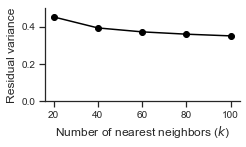

In [756]:
f, ax = plt.subplots(figsize=(set_size(single_col_width)))
ax.plot(knn, resid_vars, '-o', color='black')
ax.set_xlabel('Number of nearest neighbors ($k$)')
ax.set_ylabel('Residual variance')
ax.set_ylim(0, 0.5)
f.tight_layout()
sns.despine()
f.savefig(f'{path}/figures/isomap-k-residual-variance.png', dpi=600, bbox_inches='tight')
f.savefig(f'{path}/figures/isomap-k-residual-variance.svg', dpi=600, bbox_inches='tight')